# Burst Analysis Quickstart: Raw H5

This notebook focuses on a single `Raw H5` recording for burst-analysis prototyping. For now it:

- loads a well from a given DIV
- selects reference electrodes using the usual `PrepConfig`
- shows the initial layout-grid and pooled IFR views via the standard `ephax` analyzers
- computes per-electrode instantaneous firing-rate (IFR) traces on a shared time grid
- visualises the electrode-resolved IFR matrix and the population-average firing rate
- identifies first-pass burst anchors from the collective firing trace for later alignment work




In [86]:
%matplotlib inline

import os
import sys
from io import BytesIO
from pathlib import Path

import numpy as np
import pandas as pd
import imageio.v2 as imageio

repo_root = Path.cwd()
if not (repo_root / "ephax").exists() and (repo_root.parent / "ephax").exists():
    repo_root = repo_root.parent
if str(repo_root) not in sys.path:
    sys.path.insert(0, str(repo_root))

os.environ.setdefault("MPLCONFIGDIR", str((repo_root / ".mpl-cache").resolve()))

import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
from matplotlib.ticker import LogFormatterMathtext, LogLocator
from scipy.ndimage import gaussian_filter1d
from scipy.signal import find_peaks, peak_prominences
from IPython.display import Image, display
import plotly.graph_objects as go
from plotly.subplots import make_subplots

from ephax import RestingActivityDataset, PrepConfig, LayoutGridPlotter
from ephax.analyzers import IFRAnalyzer
from ephax.analyzers.ifr import IFRConfig
from ephax.helper_functions import calculate_ifr
from ephax.plotting import plot_high_activity_burst_windows
from ephax.metrics import (
    build_highres_traces,
    build_participation_activity_state,
    build_population_ifr as build_population_ifr_metric,
    detect_high_activity_epochs,
    detect_participation_burst_epochs,
    refine_participation_burst_anchors,
)

plt.rcParams["figure.dpi"] = 120
np.random.seed(0)



## Configure Recording and Burst View

The defaults below mirror the existing quickstart style: a 300 s recording-relative window and top-active electrode selection.




In [107]:
WELL = 5
H5_FILE_INFO = {
    0: ("ephax/data", "well_0.raw.h5", 0),
    1: ("ephax/data", "well_1.raw.h5", 1),
    2: ("ephax/data", "well_2_3.raw.h5", 2),
    3: ("ephax/data", "well_2_3.raw.h5", 3),
    4: ("ephax/data", "well_4.raw.h5", 4),
    5: ("ephax/data", "well_5.raw.h5", 5),
}

START_SEC = 0.0
END_SEC = 600.0
MIN_AMP = 0.0

TOP_START = 0
TOP_STOP = 300

IFR_GRID_HZ = 50.0
SMOOTH_SIGMA_SEC = 0.15

BURST_MIN_DISTANCE_SEC = 1.0
BURST_PROMINENCE_QUANTILE = 0.90
BURST_PROMINENCE_SCALE = 0.20
BURST_WINDOW_SEC = 2.5

COARSE_EPOCH_REL_HEIGHT = 0.20
HIGHRES_BIN_MS = 1.0
HIGHRES_SMOOTH_SIGMA_MS = 3.0
GAMMA_SEARCH_MS = 120.0
GAMMA_SEARCH_TO_EPOCH_END = True
GAMMA_MIN_DISTANCE_MS = 40.0
GAMMA_PROMINENCE_FRAC = 0.08
GAMMA_PROMINENCE_ABS_FLOOR = 0.10
GAMMA_KEEP_HEIGHT_FRAC = 0.50

NETWORK_BIN_MS = 10.0
NETWORK_MIN_PARTICIPATION_FRACTION = 0.20
NETWORK_MIN_DURATION_MS = 30.0
NETWORK_MAX_GAP_BINS = 1
HIGH_ACTIVITY_MAD_SCALE = 3.0
HIGH_ACTIVITY_MIN_DURATION_MS = 30.0
HIGH_ACTIVITY_MAX_GAP_BINS = 1
BURST_ANCHOR_WINDOW_MS = NETWORK_BIN_MS
ALIGN_PRE_MS = 20.0
ALIGN_POST_MS = 40.0
COND_PROP_DELAY_START_MS = -10.0
COND_PROP_DELAY_STOP_MS = 30.0
COND_PROP_WINDOW_HALF_WIDTH_MS = 1.0
COND_PROP_DISTANCE_BIN_UM = 100.0
COND_PROP_TRIGGER_SCOPE = "gamma"  # "gamma" or "macro_burst"
SORT_PEAK_PRE_MS = 5.0
SORT_PEAK_POST_MS = 10.0
GIF_FRAME_STEP_MS = 2.0
EXAMPLE_GAMMA_EVENT_COUNT = 6
MACRO_BURST_ZOOM_COUNT = 4
MACRO_BURST_ZOOM_PAD_SEC = 0.40
EXAMPLE_EVENT_HEX_SAVE = False
EXAMPLE_EVENT_HEX_DIR = Path('GIFs/example_event_hex')
GIF_OUTPUT_PATH = Path(f'GIFs/ephax_rawh5_well{WELL}_gamma_ifr_grid.gif')
HEX_GRID_SIZE = 50
HEX_FPS = 6
HEX_T_MIN_MS = -20.0
HEX_T_MAX_MS = 40.0
HEX_BG_COLOR = 'black'
HEX_CMAP = 'viridis'
HEXBIN_REDUCE = np.mean
HEX_BIN_MARGIN_UM = 40.0
HEX_TILE_SCALE = 1.0
HEX_TILE_MINCNT = 0
HEX_TILE_LINEWIDTH = 0.2
HEX_TILE_EDGECOLOR = (1, 1, 1, 0.08)
HEX_TILE_GRIDSIZE_X = 12
HEX_TILE_GRIDSIZE_Y = 7
HEX_TILE_KEEP_EMPTY = True
HEX_TILE_COLORBAR = True
HEX_TILE_AGG = 'mean'
HEX_TILE_POWERLIMITS = (-1, 1)
ARRAY_X_MIN_UM = 0.0
ARRAY_Y_MIN_UM = 0.0
ARRAY_X_MAX_UM = 3850.0
ARRAY_Y_MAX_UM = 2100.0

if WELL not in H5_FILE_INFO:
    raise ValueError(f'Unsupported WELL={WELL}; available wells: {sorted(H5_FILE_INFO)}')

h5_folder, h5_filename, h5_well_index = H5_FILE_INFO[WELL]
recording_label = f'raw h5 well{WELL}'
resolved_file_info = [
    ((repo_root / h5_folder).as_posix(), h5_filename, START_SEC, END_SEC, h5_well_index)
]
resolved_file_info




[('/Users/danielrebbin/Documents/GitHub/ephax/ephax/data',
  'well_5.raw.h5',
  0.0,
  600.0,
  5)]

In [ ]:
# Aggregate multi-recording configuration
AGGREGATE_WELLS = sorted(H5_FILE_INFO)
AGGREGATE_LABEL = "raw_h5"


In [88]:
ds = RestingActivityDataset.from_file_info(resolved_file_info, source='h5', min_amp=MIN_AMP)
rec = ds.recordings[0]

duration = float(rec.end_time - rec.start_time)
in_window = (rec.spikes['time'] >= rec.start_time) & (rec.spikes['time'] <= rec.end_time)
n_spikes = int(np.sum(in_window))
n_active_electrodes = int(np.unique(rec.spikes['electrode'][in_window]).size)

print(f'Loaded 1 recording from {h5_filename} (well {h5_well_index})')
print(f'Window: [{rec.start_time:.4f}, {rec.end_time:.4f}] s ({duration:.1f} s)')
print(f'Sampling rate: {rec.sf:.1f} Hz | spikes in window: {n_spikes:,} | active electrodes in window: {n_active_electrodes}')




Loaded 1 recording from well_5.raw.h5 (well 5)
Window: [0.0000, 600.0000] s (600.0 s)
Sampling rate: 10000.0 Hz | spikes in window: 67,099 | active electrodes in window: 805


## Select Reference Electrodes

Use the same `PrepConfig` pattern as elsewhere in the repo, then keep the selected electrodes fixed for the burst analysis steps below.




In [89]:
prep_cfg = PrepConfig(mode="top", top_start=TOP_START, top_stop=TOP_STOP, verbose=False)
refs = ds.select_ref_electrodes(prep_cfg)[0]

print(f"Selected {refs.size} electrodes")
print("First 20 selected electrode ids:", refs[:20])



Selected 300 electrodes
First 20 selected electrode ids: [14020 13801 22701 14021 21083 23964 21966 22833  5220 16012 18222 21961
 11628 15109 22642 13143 13361  5679 13142  5908]


## Initial Layout and IFRAnalyzer Views

Before the burst-specific plots below, reuse the standard `ephax` visualizers on the same single-recording dataset and `PrepConfig` selection.



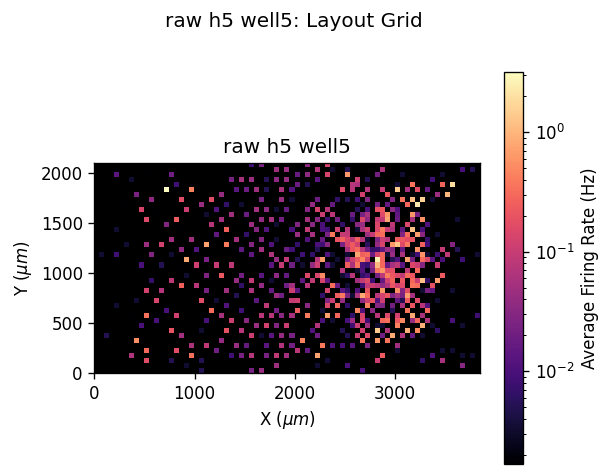

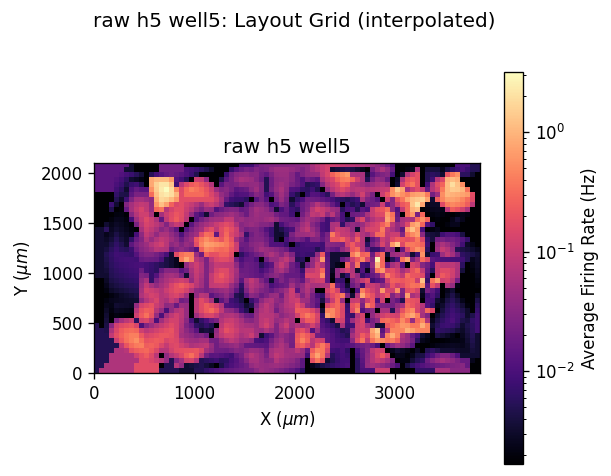

Collected 123636 IFR samples
GMM peak locations (Hz): [  0.32   6.35 114.93]


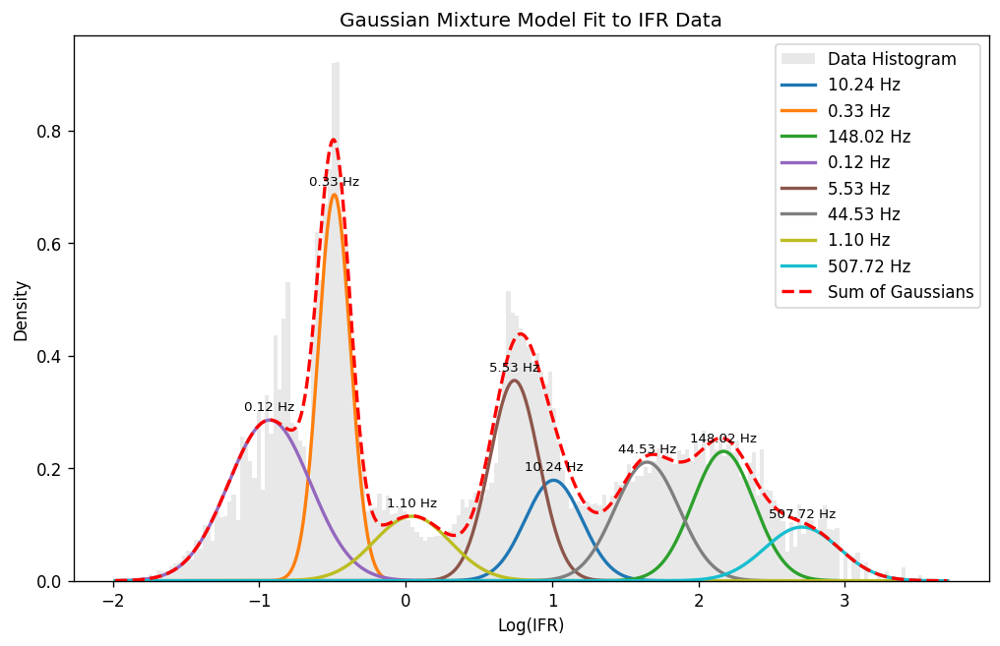

[(<Figure size 1440x960 with 3 Axes>,
  (<Axes: title={'center': 'raw h5 well5: IFRAnalyzer | raw h5 well5: Log Instantaneous Firing Rate Across Top 300 electrodes'}, xlabel='Time (s)', ylabel='Channel by Firing Frequency Rank'>,
   <Axes: title={'center': 'Histogram of Instantaneous Firing Rates'}, xlabel='Log Instantaneous Firing Rate (Hz)', ylabel='Frequency'>))]

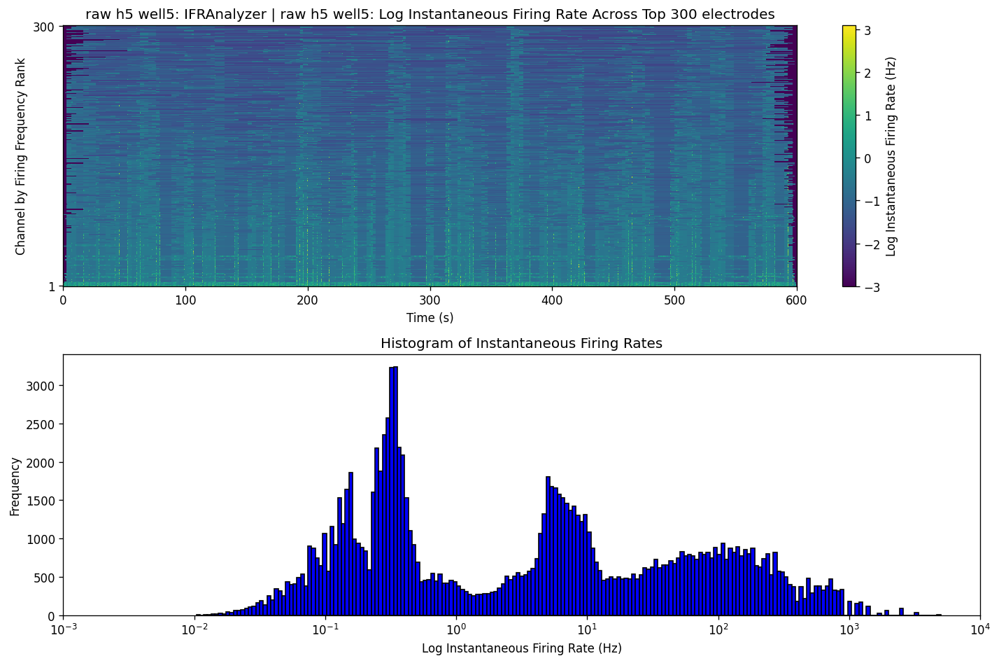

In [90]:
recording_labels = [recording_label]

lg = LayoutGridPlotter(ds)
lg.plot_grid_avghz_panel(
    grid_size=50.0,
    ncols=1,
    interpolate=False,
    title=f"{recording_label}: Layout Grid",
    recording_titles=recording_labels,
)
lg.plot_grid_avghz_panel(
    grid_size=50.0,
    ncols=1,
    interpolate=True,
    title=f"{recording_label}: Layout Grid (interpolated)",
    recording_titles=recording_labels,
)

ifr_hist_bins = 200
ifr_cfg = IFRConfig(
    log_scale=True,
    overlay_gmm=True,
    ts_bins=200,
    time_grid_hz=200.0,
    max_time_points=2_000,
)
ifr_analyzer = IFRAnalyzer.from_dataset(ds, config=ifr_cfg, selection_prep_config=prep_cfg)
peaks = ifr_analyzer.peaks()

print(f"Collected {peaks.values.size} IFR samples")
if peaks.peaks_hz.size:
    print("GMM peak locations (Hz):", np.round(peaks.peaks_hz, 2))
else:
    print("No IFR peaks detected; consider widening the selection window.")

ifr_analyzer.plot_histogram(hist_bins=ifr_hist_bins, show=True)
ifr_analyzer.plot_timeseries(
    recording_titles=recording_labels,
    title=f"{recording_label}: IFRAnalyzer",
)




## KDE-Based IFR Histograms

Plot pooled IFR samples on both linear and logarithmic axes using the same Gaussian KDE estimator. The maxima are extracted from the smoothed KDE curves in each coordinate system so we can compare dominant IFR modes without relying only on histogram binning.



In [ ]:
from scipy.stats import gaussian_kde


def collect_pooled_ifr_values_hz(dataset, selected_refs_per_recording):
    spikes_list, _layouts, start_times, end_times = dataset.to_legacy()
    pooled = []
    for spikes_data, start_time, end_time, selected_refs in zip(
        spikes_list,
        start_times,
        end_times,
        selected_refs_per_recording,
    ):
        _, _, ifr_vals = calculate_ifr(spikes_data, selected_refs, start_time, end_time)
        pooled.extend(ifr_vals)
    pooled = np.asarray(pooled, dtype=float)
    pooled = pooled[np.isfinite(pooled) & (pooled > 0)]
    return pooled


def binned_kde_peak_summary(values_hz, log_bins=False, n_bins=120, grid_size=2048, prominence_fraction=0.03, distance_fraction=0.02):
    values_hz = np.asarray(values_hz, dtype=float)
    values_hz = values_hz[np.isfinite(values_hz) & (values_hz > 0)]
    if values_hz.size < 2:
        return {
            'plot_edges_hz': np.array([], dtype=float),
            'plot_centers_hz': np.array([], dtype=float),
            'counts': np.array([], dtype=float),
            'grid_hz': np.array([], dtype=float),
            'smoothed_counts': np.array([], dtype=float),
            'peak_hz': np.array([], dtype=float),
            'peak_counts': np.array([], dtype=float),
        }

    if log_bins:
        domain_values = np.log10(values_hz)
        domain_edges = np.linspace(float(domain_values.min()), float(domain_values.max()), int(n_bins) + 1)
        domain_centers = 0.5 * (domain_edges[:-1] + domain_edges[1:])
        plot_edges_hz = np.power(10.0, domain_edges)
        plot_centers_hz = np.power(10.0, domain_centers)
        domain_grid = np.linspace(domain_edges[0], domain_edges[-1], int(grid_size))
        grid_hz = np.power(10.0, domain_grid)
    else:
        domain_values = values_hz
        domain_edges = np.linspace(float(values_hz.min()), float(values_hz.max()), int(n_bins) + 1)
        domain_centers = 0.5 * (domain_edges[:-1] + domain_edges[1:])
        plot_edges_hz = domain_edges
        plot_centers_hz = domain_centers
        domain_grid = np.linspace(domain_edges[0], domain_edges[-1], int(grid_size))
        grid_hz = domain_grid

    counts, _ = np.histogram(domain_values, bins=domain_edges)
    counts = counts.astype(float)
    valid = counts > 0
    if not np.any(valid):
        return {
            'plot_edges_hz': plot_edges_hz,
            'plot_centers_hz': plot_centers_hz,
            'counts': counts,
            'grid_hz': grid_hz,
            'smoothed_counts': np.zeros_like(domain_grid),
            'peak_hz': np.array([], dtype=float),
            'peak_counts': np.array([], dtype=float),
        }

    kde = gaussian_kde(domain_centers[valid], weights=counts[valid], bw_method='scott')
    density = kde(domain_grid)
    bin_width = float(np.mean(np.diff(domain_edges)))
    smoothed_counts = density * float(counts.sum()) * bin_width

    peak_idx, _ = find_peaks(
        smoothed_counts,
        prominence=float(np.nanmax(smoothed_counts)) * prominence_fraction,
        distance=max(1, int(len(domain_grid) * distance_fraction)),
    )
    if peak_idx.size == 0:
        peak_idx = np.array([int(np.argmax(smoothed_counts))], dtype=int)
    order = np.argsort(smoothed_counts[peak_idx])[::-1]
    peak_idx = peak_idx[order]

    return {
        'plot_edges_hz': plot_edges_hz,
        'plot_centers_hz': plot_centers_hz,
        'counts': counts,
        'grid_hz': grid_hz,
        'smoothed_counts': smoothed_counts,
        'peak_hz': grid_hz[peak_idx],
        'peak_counts': smoothed_counts[peak_idx],
    }


ifr_positive_hz = collect_pooled_ifr_values_hz(ds, ifr_analyzer._refs_per_recording)
linear_hist = binned_kde_peak_summary(ifr_positive_hz, log_bins=False)
log_hist = binned_kde_peak_summary(ifr_positive_hz, log_bins=True)

fig, axes = plt.subplots(1, 2, figsize=(15, 4.8), constrained_layout=True)
ax0, ax1 = axes

linear_widths = np.diff(linear_hist['plot_edges_hz'])
ax0.bar(
    linear_hist['plot_centers_hz'],
    linear_hist['counts'],
    width=linear_widths,
    color='0.82',
    edgecolor='0.55',
    align='center',
)
ax0.plot(linear_hist['grid_hz'], linear_hist['smoothed_counts'], color='black', lw=2.0)
ax0.scatter(linear_hist['peak_hz'], linear_hist['peak_counts'], color='crimson', s=32, zorder=3)
for peak_hz, peak_counts in zip(linear_hist['peak_hz'][:6], linear_hist['peak_counts'][:6]):
    ax0.text(float(peak_hz), float(peak_counts), f"{peak_hz:.2f}", fontsize=8, ha='left', va='bottom')
ax0.set_xlabel('Instantaneous firing rate (Hz)')
ax0.set_ylabel('Count')
ax0.set_title('Linear-bin IFR histogram with binned-KDE maxima')

log_widths = np.diff(log_hist['plot_edges_hz'])
ax1.bar(
    log_hist['plot_centers_hz'],
    log_hist['counts'],
    width=log_widths,
    color='0.82',
    edgecolor='0.55',
    align='center',
)
ax1.plot(log_hist['grid_hz'], log_hist['smoothed_counts'], color='black', lw=2.0)
ax1.scatter(log_hist['peak_hz'], log_hist['peak_counts'], color='crimson', s=32, zorder=3)
for peak_hz, peak_counts in zip(log_hist['peak_hz'][:6], log_hist['peak_counts'][:6]):
    ax1.text(float(peak_hz), float(peak_counts), f"{peak_hz:.2f}", fontsize=8, ha='left', va='bottom')
ax1.set_xscale('log')
ax1.set_xlabel('Instantaneous firing rate (Hz)')
ax1.set_ylabel('Count')
ax1.set_title('Log-bin IFR histogram with binned-KDE maxima')

plt.show()

ifr_kde_peak_summary = pd.DataFrame(
    {
        'axis': ['linear'] * linear_hist['peak_hz'].size + ['log_bins'] * log_hist['peak_hz'].size,
        'peak_hz': np.concatenate([linear_hist['peak_hz'], log_hist['peak_hz']]),
        'peak_count': np.concatenate([linear_hist['peak_counts'], log_hist['peak_counts']]),
    }
).sort_values(['axis', 'peak_count'], ascending=[True, False], ignore_index=True)

print('Top binned-KDE peaks (linear bins):', np.round(linear_hist['peak_hz'][:6], 3))
print('Top binned-KDE peaks (log bins):', np.round(log_hist['peak_hz'][:6], 3))
ifr_kde_peak_summary.head(12)



## Build a Shared IFR Matrix

Each selected electrode gets interpolated onto the same time grid. The burst population trace is the pointwise mean across the selected electrodes.



In [91]:
def build_population_ifr(recording, selected_electrodes, grid_hz=50.0, smooth_sigma_sec=0.15):
    ifr_data, per_electrode_mean_hz, _ = calculate_ifr(
        recording.spikes,
        selected_electrodes,
        recording.start_time,
        recording.end_time,
    )

    dt = 1.0 / float(grid_hz)
    time_grid = np.arange(recording.start_time, recording.end_time, dt, dtype=float)

    traces = []
    electrodes = []
    avg_rates = []
    for el in np.asarray(selected_electrodes, dtype=int):
        if int(el) not in ifr_data:
            continue
        times, values = ifr_data[int(el)]
        sample_idx = np.searchsorted(times, time_grid, side="right") - 1
        trace = np.zeros_like(time_grid, dtype=float)
        valid_mask = sample_idx >= 0
        if np.any(valid_mask):
            trace[valid_mask] = values[sample_idx[valid_mask]]
        traces.append(trace)
        electrodes.append(int(el))
        avg_rates.append(float(per_electrode_mean_hz[int(el)]))

    if not traces:
        raise ValueError("No IFR traces were produced for the selected electrodes.")

    ifr_matrix = np.asarray(traces, dtype=float)
    mean_ifr = ifr_matrix.mean(axis=0)
    sigma_bins = max(float(smooth_sigma_sec) * float(grid_hz), 1e-6)
    mean_ifr_smooth = gaussian_filter1d(mean_ifr, sigma=sigma_bins, mode="nearest")

    return {
        "time_grid": time_grid,
        "electrodes": np.asarray(electrodes, dtype=int),
        "ifr_matrix": ifr_matrix,
        "mean_ifr": mean_ifr,
        "mean_ifr_smooth": mean_ifr_smooth,
        "per_electrode_mean_hz": np.asarray(avg_rates, dtype=float),
    }


burst_data = build_population_ifr(
    rec,
    refs,
    grid_hz=IFR_GRID_HZ,
    smooth_sigma_sec=SMOOTH_SIGMA_SEC,
)

time_grid = burst_data["time_grid"]
ifr_matrix = burst_data["ifr_matrix"]
mean_ifr = burst_data["mean_ifr"]
mean_ifr_smooth = burst_data["mean_ifr_smooth"]

def plot_ifr_summary(time_axis, ifr_view, mean_view, mean_smooth_view, heatmap_title, mean_title, mean_log_scale=False):
    positive_ifr = ifr_view[ifr_view > 0]
    if positive_ifr.size == 0:
        raise ValueError("IFR view contains no positive values for log-scale plotting.")

    heatmap_vmin = max(1e-3, float(np.quantile(positive_ifr, 0.01)))
    heatmap_vmax = float(positive_ifr.max())
    heatmap_vmax = max(heatmap_vmax, heatmap_vmin * (1.0 + 1e-6))
    mean_log_floor = max(heatmap_vmin, 1e-3)

    fig = plt.figure(figsize=(14, 8), constrained_layout=True)
    gs = fig.add_gridspec(
        2,
        2,
        height_ratios=[3.0, 1.6],
        width_ratios=[40.0, 1.6],
    )
    ax0 = fig.add_subplot(gs[0, 0])
    ax1 = fig.add_subplot(gs[1, 0], sharex=ax0)
    cax = fig.add_subplot(gs[0, 1])
    fig.add_subplot(gs[1, 1]).axis("off")

    display_ifr = np.clip(ifr_view, heatmap_vmin, heatmap_vmax)
    im = ax0.imshow(
        display_ifr,
        aspect="auto",
        origin="lower",
        extent=[time_axis[0], time_axis[-1], 0.5, ifr_view.shape[0] + 0.5],
        cmap="viridis",
        norm=LogNorm(vmin=heatmap_vmin, vmax=heatmap_vmax),
    )
    ax0.set_ylabel("Selected electrode rank")
    ax0.set_yticks([1, ifr_view.shape[0]])
    ax0.set_title(heatmap_title)

    cbar = fig.colorbar(im, cax=cax)
    cbar.set_label("Instantaneous firing rate (Hz, log scale)")
    cbar.locator = LogLocator(base=10)
    cbar.formatter = LogFormatterMathtext(base=10)
    cbar.update_ticks()

    if mean_log_scale:
        ax1.plot(time_axis, np.clip(mean_view, mean_log_floor, None), color="0.70", lw=1.0, label="Population mean IFR")
        ax1.plot(
            time_axis,
            np.clip(mean_smooth_view, mean_log_floor, None),
            color="black",
            lw=2.0,
            label=f"Smoothed mean IFR (sigma={SMOOTH_SIGMA_SEC:.2f} s)",
        )
        ax1.set_yscale("log")
        ax1.set_ylabel("Hz (log scale)")
    else:
        ax1.plot(time_axis, mean_view, color="0.70", lw=1.0, label="Population mean IFR")
        ax1.plot(
            time_axis,
            mean_smooth_view,
            color="black",
            lw=2.0,
            label=f"Smoothed mean IFR (sigma={SMOOTH_SIGMA_SEC:.2f} s)",
        )
        ax1.set_ylabel("Hz")

    ax1.set_xlabel("Time (s)")
    ax1.set_title(mean_title)
    ax1.legend(loc="upper right")
    ax1.set_xlim(float(time_axis[0]), float(time_axis[-1]))
    plt.show()

print(f"IFR matrix shape: {ifr_matrix.shape}")
print(f"Population mean range: {mean_ifr.min():.3f} to {mean_ifr.max():.3f} Hz")
print(f"Smoothed population mean range: {mean_ifr_smooth.min():.3f} to {mean_ifr_smooth.max():.3f} Hz")
global_positive_ifr = ifr_matrix[ifr_matrix > 0]
global_heatmap_vmin = max(1e-3, float(np.quantile(global_positive_ifr, 0.01)))
global_heatmap_vmax = float(global_positive_ifr.max())
print(f"Global heatmap log scale range: {global_heatmap_vmin:.4f} to {global_heatmap_vmax:.4f} Hz")



IFR matrix shape: (300, 30000)
Population mean range: 0.000 to 70.539 Hz
Smoothed population mean range: 0.002 to 4.685 Hz
Global heatmap log scale range: 0.0157 to 3333.3333 Hz


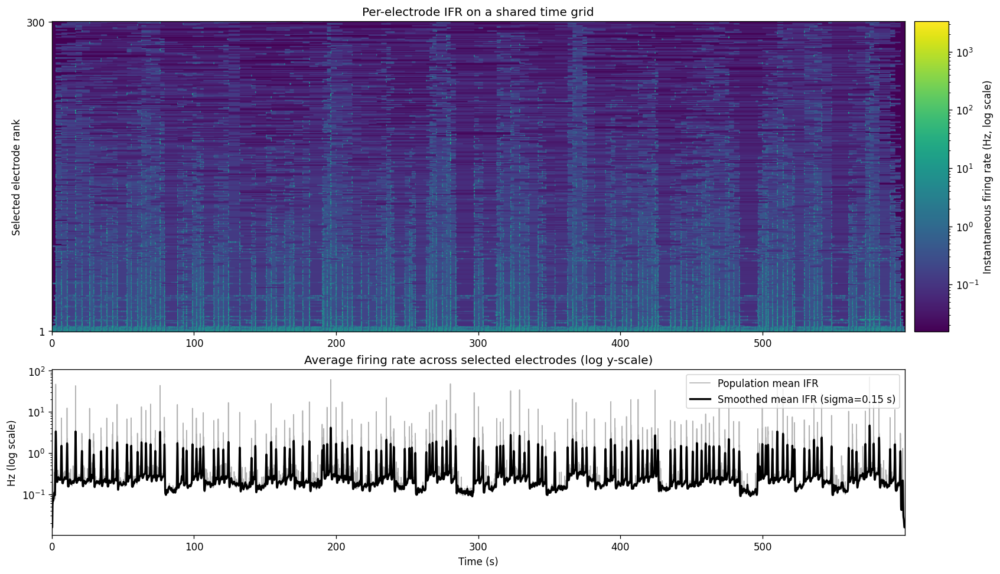

In [92]:

plot_ifr_summary(
    time_grid,
    ifr_matrix,
    mean_ifr,
    mean_ifr_smooth,
    heatmap_title="Per-electrode IFR on a shared time grid",
    mean_title="Average firing rate across selected electrodes (log y-scale)",
    mean_log_scale=True,
)



## Zoom Into a High-Activity Window

The full 300 s trace is useful for context, but a short zoom makes the cross-electrode burst structure easier to inspect.



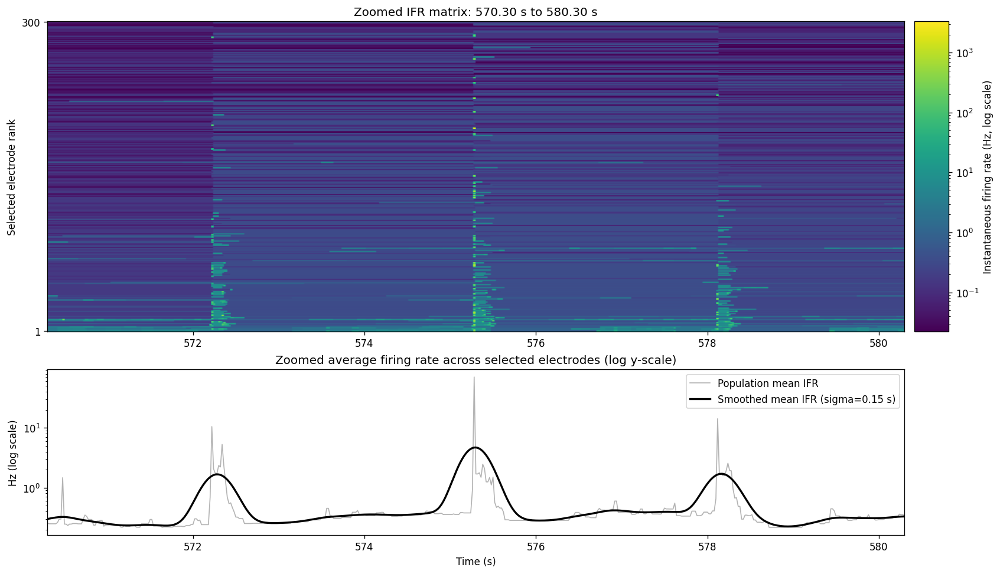

In [93]:
zoom_center_sec = float(time_grid[np.argmax(mean_ifr_smooth)])
zoom_half_width_sec = 5.0
zoom_start = max(time_grid[0], zoom_center_sec - zoom_half_width_sec)
zoom_stop = min(time_grid[-1], zoom_center_sec + zoom_half_width_sec)
zoom_mask = (time_grid >= zoom_start) & (time_grid <= zoom_stop)

plot_ifr_summary(
    time_grid[zoom_mask],
    ifr_matrix[:, zoom_mask],
    mean_ifr[zoom_mask],
    mean_ifr_smooth[zoom_mask],
    heatmap_title=f"Zoomed IFR matrix: {zoom_start:.2f} s to {zoom_stop:.2f} s",
    mean_title="Zoomed average firing rate across selected electrodes (log y-scale)",
    mean_log_scale=True,
)



## Nested Burst and Gamma Anchors

We now separate the problem into two scales:

- a **coarse burst epoch** on the slow population IFR trace
- a **nested gamma anchor** inside that burst using a high-resolution spike-density signal

This avoids treating several slow subpeaks from the same burst as independent events.



In [ ]:
highres = build_highres_traces(
    rec,
    refs,
    bin_ms=HIGHRES_BIN_MS,
    smooth_sigma_ms=HIGHRES_SMOOTH_SIGMA_MS,
)
highres_data = {
    "bin_edges_s": highres.bin_edges_s,
    "time_centers_s": highres.time_centers_s,
    "electrodes": highres.electrodes,
    "per_electrode_rate_hz": highres.per_electrode_rate_hz,
    "population_rate_hz": highres.population_rate_hz,
    "spikes_by_electrode": highres.spikes_by_electrode,
    "spike_presence": highres.spike_presence,
}

high_activity_epochs, high_activity_info = detect_high_activity_epochs(
    time_grid,
    mean_ifr_smooth,
    mad_scale=HIGH_ACTIVITY_MAD_SCALE,
    min_duration_ms=HIGH_ACTIVITY_MIN_DURATION_MS,
    max_gap_bins=HIGH_ACTIVITY_MAX_GAP_BINS,
)
participation_activity = build_participation_activity_state(
    highres,
    aggregation_ms=NETWORK_BIN_MS,
)
hierarchical_burst_epochs = detect_participation_burst_epochs(
    participation_activity,
    high_activity_epochs,
    min_participation_fraction=NETWORK_MIN_PARTICIPATION_FRACTION,
    min_duration_ms=NETWORK_MIN_DURATION_MS,
    max_gap_bins=NETWORK_MAX_GAP_BINS,
)
hierarchical_burst_epochs = refine_participation_burst_anchors(
    highres,
    hierarchical_burst_epochs,
    anchor_window_ms=BURST_ANCHOR_WINDOW_MS,
)

analysis_epochs = hierarchical_burst_epochs.copy()
analysis_anchors = analysis_epochs.copy()
if not analysis_anchors.empty:
    analysis_anchors["coarse_event_idx"] = analysis_anchors["event_idx"].astype(int)
    analysis_anchors["gamma_peak_rank"] = 0
    analysis_anchors["onset_time_s"] = analysis_anchors["start_time_s"].astype(float)
    analysis_anchors["anchor_height_hz"] = analysis_anchors["anchor_population_rate_hz"].astype(float)
    analysis_anchors["gamma_anchor_delay_ms"] = (analysis_anchors["anchor_time_s"] - analysis_anchors["onset_time_s"]) * 1000.0
    analysis_anchors["anchor_type"] = "refined_max_participation"
    analysis_anchors["n_local_peaks"] = 1
    analysis_anchors["n_passing_prominence"] = 1
    analysis_anchors["n_kept_gamma_peaks"] = 1
    analysis_anchors["prominence_floor_hz"] = np.nan
    analysis_anchors["keep_height_floor_hz"] = np.nan

# Compatibility aliases for later exploratory cells. These now refer to the
# high-activity participation bursts, not the old rate-peak/gamma detector.
coarse_epochs = analysis_epochs.copy()
nested_anchors = analysis_anchors.copy()
raw_peak_idx = np.array([], dtype=int)
raw_peak_props = {}

print(f"High-activity periods: {len(high_activity_epochs)}")
print(f"Nested high-activity participation bursts: {len(analysis_epochs)}")
print(f"High-activity threshold: {high_activity_info['threshold_hz']:.3f} Hz")
print(f"Refined max-participation burst anchors: {len(analysis_anchors)}")

summary = pd.DataFrame(
    [
        {
            "method": "high_activity_participation",
            "n_high_activity_periods": len(high_activity_epochs),
            "n_bursts": len(analysis_epochs),
            "n_burst_peak_anchors": len(analysis_anchors),
            "anchor_type": "refined_max_participation",
            "total_high_activity_duration_s": float(high_activity_epochs["duration_ms"].sum() / 1000.0) if not high_activity_epochs.empty else 0.0,
            "total_burst_duration_s": float(analysis_epochs["duration_ms"].sum() / 1000.0) if not analysis_epochs.empty else 0.0,
        }
    ]
)
display(summary.round(3))

display(analysis_anchors[[
    "event_idx",
    "high_activity_event_idx",
    "start_time_s",
    "end_time_s",
    "coarse_anchor_time_s",
    "anchor_time_s",
    "anchor_participation_fraction",
    "anchor_population_rate_hz",
    "peak_active_electrodes",
    "participating_electrodes",
    "duration_ms",
    "anchor_type",
]].head(10).round(3))


In [ ]:
fig, axes = plot_high_activity_burst_windows(
    time_grid=time_grid,
    mean_ifr=mean_ifr,
    mean_ifr_smooth=mean_ifr_smooth,
    network_activity=participation_activity,
    high_activity_epochs=high_activity_epochs,
    burst_epochs=analysis_epochs,
    high_activity_threshold_hz=high_activity_info["threshold_hz"],
    participation_threshold=NETWORK_MIN_PARTICIPATION_FRACTION,
    n_windows=3,
    pad_s=max(1.5, float(MACRO_BURST_ZOOM_PAD_SEC)),
)
fig.suptitle(
    "High-activity periods with nested max-participation burst anchors",
    y=1.02,
)
plt.show()

display(high_activity_epochs.head(10).round(3))
display(analysis_epochs[[
    "event_idx",
    "high_activity_event_idx",
    "start_time_s",
    "end_time_s",
    "coarse_anchor_time_s",
    "anchor_time_s",
    "anchor_participation_fraction",
    "anchor_population_rate_hz",
    "peak_active_electrodes",
    "participating_electrodes",
    "total_spikes",
    "duration_ms",
]].head(12).round(3))


## High-Activity Burst Zoom With Refined Participation Anchors
Inspect representative high-activity participation bursts at higher resolution. The burst windows and anchors here come from the same detector used for the IFR state split below.


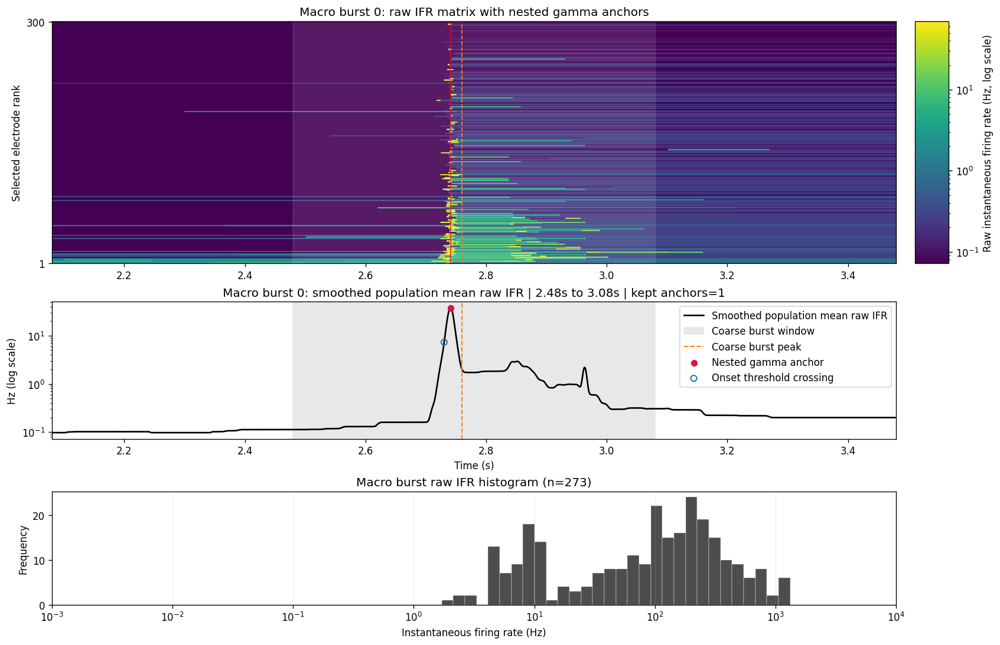

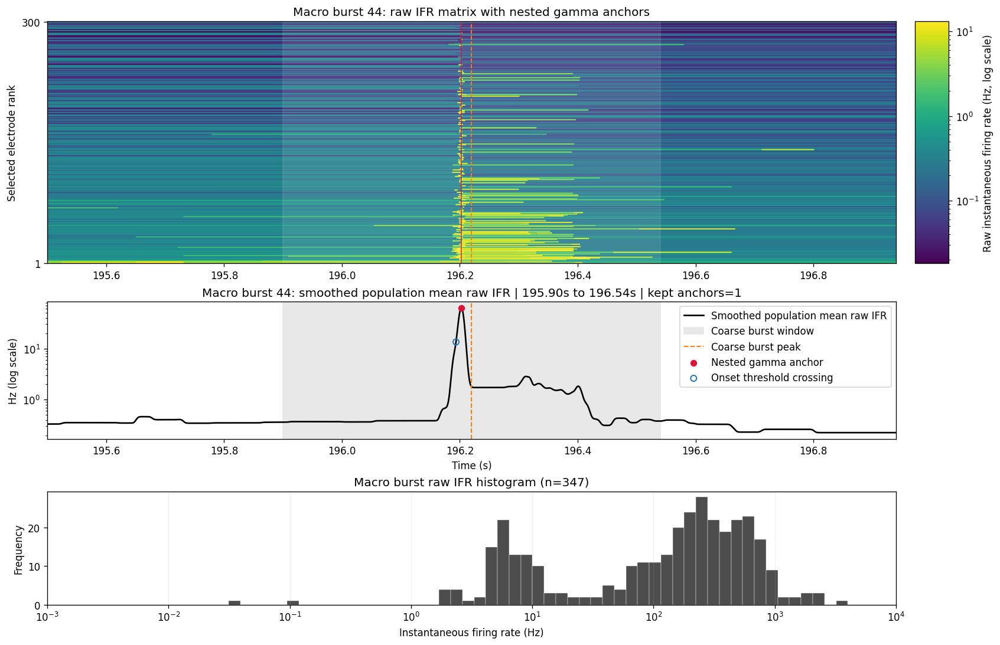

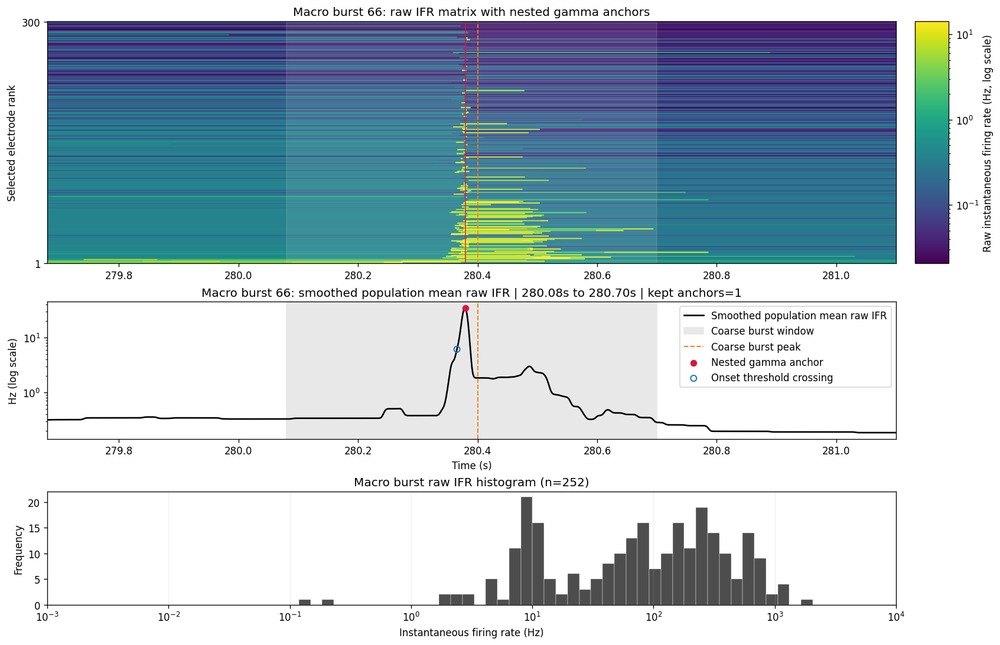

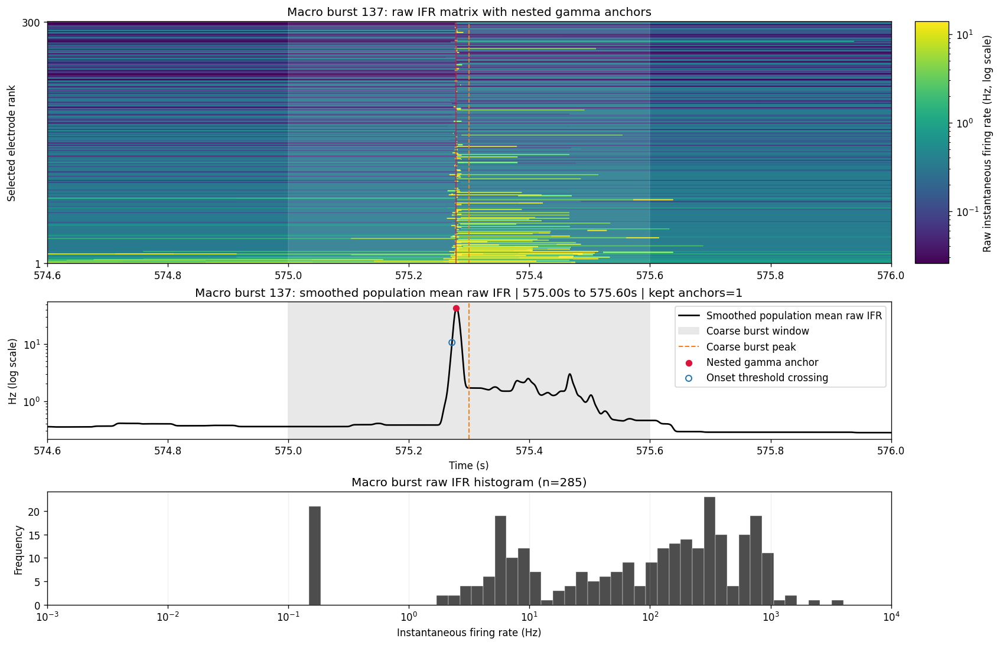

,coarse_event_idx,anchor_time_s,onset_time_s,gamma_anchor_delay_ms,anchor_height_hz,n_kept_gamma_peaks
0,0,2.742,2.730,11.0,80.666,1
1,1,6.710,6.696,13.0,57.600,1
2,2,10.676,10.662,15.0,43.364,1
3,3,16.678,16.659,18.0,77.719,1
4,4,21.092,21.078,13.0,54.910,1
...,...,...,...,...,...,...
175,140,589.670,589.650,20.0,44.411,1
176,141,593.094,593.054,39.0,27.796,1
177,142,596.866,596.844,21.0,19.374,2
178,142,596.982,596.844,138.0,8.343,2


In [96]:
if coarse_epochs.empty:
    raise ValueError("No coarse burst epochs were detected for macro-burst zooming.")

macro_event_ids = (
    coarse_epochs.sort_values("coarse_peak_hz", ascending=False)["event_idx"]
    .head(int(MACRO_BURST_ZOOM_COUNT))
    .to_numpy(dtype=int)
)
macro_event_ids = np.sort(macro_event_ids)

time_centers_highres = highres_data["time_centers_s"]
population_rate_highres = highres_data["population_rate_hz"]

macro_spike_times = np.asarray(rec.spikes["time"], dtype=float)
macro_spike_electrodes = np.asarray(rec.spikes["electrode"], dtype=int)
macro_selected_electrodes = np.asarray(refs, dtype=int)
macro_raw_ifr_data, _, _ = calculate_ifr(
    rec.spikes,
    refs,
    rec.start_time,
    rec.end_time,
)
macro_raw_ifr_highres = []
macro_interval_midpoints = {}
macro_interval_ifr = {}
all_macro_ifr = []
for electrode in macro_selected_electrodes:
    if int(electrode) in macro_raw_ifr_data:
        ifr_times, ifr_values = macro_raw_ifr_data[int(electrode)]
        value_idx = np.searchsorted(ifr_times, time_centers_highres, side="right") - 1
        value_idx = np.clip(value_idx, 0, len(ifr_values) - 1)
        macro_raw_ifr_highres.append(ifr_values[value_idx])
    else:
        macro_raw_ifr_highres.append(np.zeros_like(time_centers_highres, dtype=float))

    electrode_times = np.sort(
        macro_spike_times[
            (macro_spike_electrodes == int(electrode))
            & (macro_spike_times >= rec.start_time)
            & (macro_spike_times <= rec.end_time)
        ]
    )
    if electrode_times.size < 2:
        macro_interval_midpoints[int(electrode)] = np.array([], dtype=float)
        macro_interval_ifr[int(electrode)] = np.array([], dtype=float)
        continue

    isi_s = np.diff(electrode_times)
    valid_isi = isi_s > 0
    mids = 0.5 * (electrode_times[:-1][valid_isi] + electrode_times[1:][valid_isi])
    vals = 1.0 / isi_s[valid_isi]
    macro_interval_midpoints[int(electrode)] = mids
    macro_interval_ifr[int(electrode)] = vals
    if vals.size > 0:
        all_macro_ifr.append(vals)
macro_raw_ifr_highres = np.asarray(macro_raw_ifr_highres, dtype=float)
macro_population_mean_raw_ifr = macro_raw_ifr_highres.mean(axis=0)
macro_population_mean_raw_ifr_smooth = gaussian_filter1d(
    macro_population_mean_raw_ifr,
    sigma=max(1e-6, float(HIGHRES_SMOOTH_SIGMA_MS) / float(HIGHRES_BIN_MS)),
    mode="nearest",
)

if not all_macro_ifr:
    raise ValueError("No positive ISI-derived IFR values were found for macro-burst histograms.")

all_macro_ifr = np.concatenate(all_macro_ifr).astype(float)

macro_log_bins = np.linspace(
    float(np.log10(np.clip(all_macro_ifr, 1e-12, None)).min()),
    float(np.log10(np.clip(all_macro_ifr, 1e-12, None)).max()),
    60,
)
macro_population_positive = macro_population_mean_raw_ifr_smooth[macro_population_mean_raw_ifr_smooth > 0]
macro_population_floor = max(1e-2, float(np.quantile(macro_population_positive, 0.02))) if macro_population_positive.size else 1e-2

for event_id in macro_event_ids:
    coarse_row = coarse_epochs.loc[coarse_epochs["event_idx"] == int(event_id)].iloc[0]
    anchor_rows = nested_anchors.loc[nested_anchors["coarse_event_idx"] == int(event_id)].copy()

    view_start = max(float(time_grid[0]), float(coarse_row["start_time_s"]) - float(MACRO_BURST_ZOOM_PAD_SEC))
    view_stop = min(float(time_grid[-1]), float(coarse_row["end_time_s"]) + float(MACRO_BURST_ZOOM_PAD_SEC))
    view_mask = (time_centers_highres >= view_start) & (time_centers_highres <= view_stop)
    burst_interval_ifr = []
    for electrode in macro_selected_electrodes:
        mids = macro_interval_midpoints[int(electrode)]
        vals = macro_interval_ifr[int(electrode)]
        in_burst = (mids >= float(coarse_row["start_time_s"])) & (mids <= float(coarse_row["end_time_s"]))
        if np.any(in_burst):
            burst_interval_ifr.append(vals[in_burst])
    burst_interval_ifr = np.concatenate(burst_interval_ifr).astype(float) if burst_interval_ifr else np.array([], dtype=float)

    fig = plt.figure(figsize=(14, 9), constrained_layout=True)
    gs = fig.add_gridspec(3, 2, height_ratios=[3.0, 1.7, 1.4], width_ratios=[40.0, 1.6])
    ax0 = fig.add_subplot(gs[0, 0])
    ax1 = fig.add_subplot(gs[1, 0], sharex=ax0)
    ax2 = fig.add_subplot(gs[2, 0])
    cax = fig.add_subplot(gs[0, 1])
    fig.add_subplot(gs[1, 1]).axis("off")
    fig.add_subplot(gs[2, 1]).axis("off")

    macro_positive = macro_raw_ifr_highres[:, view_mask]
    macro_positive = macro_positive[macro_positive > 0]
    macro_vmin = max(1e-2, float(np.quantile(macro_positive, 0.02))) if macro_positive.size else 1e-2
    macro_vmax = max(macro_vmin * 10.0, float(np.quantile(macro_positive, 0.995))) if macro_positive.size else 1.0
    display_ifr = np.clip(macro_raw_ifr_highres[:, view_mask], macro_vmin, macro_vmax)
    im = ax0.imshow(
        display_ifr,
        aspect="auto",
        origin="lower",
        extent=[view_start, view_stop, 0.5, ifr_matrix.shape[0] + 0.5],
        cmap="viridis",
        norm=LogNorm(vmin=macro_vmin, vmax=macro_vmax),
    )
    ax0.axvspan(float(coarse_row["start_time_s"]), float(coarse_row["end_time_s"]), color="white", alpha=0.10)
    ax0.axvline(float(coarse_row["coarse_peak_time_s"]), color="tab:orange", ls="--", lw=1.1)
    if not anchor_rows.empty:
        for anchor_time in anchor_rows["anchor_time_s"].to_numpy(dtype=float):
            ax0.axvline(float(anchor_time), color="crimson", ls="-", lw=0.9, alpha=0.95)
    ax0.set_ylabel("Selected electrode rank")
    ax0.set_yticks([1, ifr_matrix.shape[0]])
    ax0.set_title(f"Macro burst {int(event_id)}: raw IFR matrix with nested gamma anchors")

    cbar = fig.colorbar(im, cax=cax)
    cbar.set_label("Raw instantaneous firing rate (Hz, log scale)")
    cbar.locator = LogLocator(base=10)
    cbar.formatter = LogFormatterMathtext(base=10)
    cbar.update_ticks()

    ax1.plot(
        time_centers_highres[view_mask],
        np.clip(macro_population_mean_raw_ifr_smooth[view_mask], macro_population_floor, None),
        color="black",
        lw=1.6,
        label="Smoothed population mean raw IFR",
    )
    ax1.axvspan(float(coarse_row["start_time_s"]), float(coarse_row["end_time_s"]), color="0.90", alpha=0.9, label="Coarse burst window")
    ax1.axvline(float(coarse_row["coarse_peak_time_s"]), color="tab:orange", ls="--", lw=1.2, label="Coarse burst peak")
    if not anchor_rows.empty:
        ax1.scatter(
            anchor_rows["anchor_time_s"],
            np.clip(np.interp(anchor_rows["anchor_time_s"], time_centers_highres, macro_population_mean_raw_ifr_smooth), macro_population_floor, None),
            color="crimson",
            s=34,
            zorder=4,
            label="Nested gamma anchor",
        )
        ax1.scatter(
            anchor_rows["onset_time_s"],
            np.clip(np.interp(anchor_rows["onset_time_s"], time_centers_highres, macro_population_mean_raw_ifr_smooth), macro_population_floor, None),
            facecolors="none",
            edgecolors="tab:blue",
            s=36,
            linewidths=1.2,
            zorder=4,
            label="Onset threshold crossing",
        )
    ax1.set_yscale("log")
    ax1.set_ylabel("Hz (log scale)")
    ax1.set_xlabel("Time (s)")
    ax1.set_xlim(view_start, view_stop)
    ax1.set_title(
        f"Macro burst {int(event_id)}: smoothed population mean raw IFR | {float(coarse_row['start_time_s']):.2f}s to {float(coarse_row['end_time_s']):.2f}s | kept anchors={len(anchor_rows)}"
    )

    handles, labels = ax1.get_legend_handles_labels()
    dedup = dict(zip(labels, handles))
    ax1.legend(dedup.values(), dedup.keys(), loc="upper right")

    if burst_interval_ifr.size > 0:
        burst_log_ifr = np.log10(np.clip(burst_interval_ifr, 1e-12, None))
        ax2.hist(
            burst_log_ifr,
            bins=macro_log_bins,
            color="0.30",
            edgecolor="white",
            linewidth=0.25,
        )
    ax2.set_title(f"Macro burst raw IFR histogram (n={int(burst_interval_ifr.size)})")
    ax2.set_ylabel("Frequency")
    ax2.set_xlabel("Instantaneous firing rate (Hz)")
    ax2.grid(True, axis="x", alpha=0.18)
    hist_ticks = ax2.get_xticks()
    ax2.set_xticks(hist_ticks)
    ax2.set_xticklabels(
        [f"$10^{{{int(x)}}}$" if float(x).is_integer() else f"$10^{{{x:.1f}}}$" for x in hist_ticks],
        rotation=0,
    )

    plt.show()

nested_anchors[[
    "coarse_event_idx",
    "anchor_time_s",
    "onset_time_s",
    "gamma_anchor_delay_ms",
    "anchor_height_hz",
    "n_kept_gamma_peaks",
]].sort_values(["coarse_event_idx", "anchor_time_s"]).round(3)



## IFR Histogram by Activity State
Use the high-activity periods and nested participation bursts to split raw ISI-derived IFR samples into low activity, high activity non-burst, and burst states.


In [ ]:
def interval_membership(times_s, intervals_df):
    times_s = np.asarray(times_s, dtype=float)
    membership = np.zeros(times_s.shape, dtype=bool)
    if intervals_df is None or intervals_df.empty or times_s.size == 0:
        return membership
    for row in intervals_df.itertuples(index=False):
        membership |= (times_s >= float(row.start_time_s)) & (times_s <= float(row.end_time_s))
    return membership

state_ifr = {
    "low_activity": [],
    "high_activity": [],
    "burst": [],
}
spike_times_all = np.asarray(rec.spikes["time"], dtype=float)
spike_electrodes_all = np.asarray(rec.spikes["electrode"], dtype=int)
selected_electrodes = np.asarray(refs, dtype=int)

for electrode in selected_electrodes:
    electrode_times = np.sort(
        spike_times_all[
            (spike_electrodes_all == int(electrode))
            & (spike_times_all >= rec.start_time)
            & (spike_times_all <= rec.end_time)
        ]
    )
    if electrode_times.size < 2:
        continue

    interval_starts = electrode_times[:-1]
    interval_stops = electrode_times[1:]
    isi_s = interval_stops - interval_starts
    valid_mask = isi_s > 0
    if not np.any(valid_mask):
        continue

    interval_midpoints = 0.5 * (interval_starts[valid_mask] + interval_stops[valid_mask])
    ifr_values_hz = 1.0 / isi_s[valid_mask]

    in_burst = interval_membership(interval_midpoints, analysis_epochs)
    in_high_activity = interval_membership(interval_midpoints, high_activity_epochs)
    state_ifr["burst"].append(ifr_values_hz[in_burst])
    state_ifr["high_activity"].append(ifr_values_hz[in_high_activity & ~in_burst])
    state_ifr["low_activity"].append(ifr_values_hz[~in_high_activity])

state_ifr_positive = {}
for state, chunks in state_ifr.items():
    nonempty_chunks = [chunk for chunk in chunks if chunk.size > 0]
    vals = np.concatenate(nonempty_chunks).astype(float) if nonempty_chunks else np.array([], dtype=float)
    vals = vals[np.isfinite(vals) & (vals > 0)]
    if vals.size == 0:
        raise ValueError(f"No positive raw IFR values were found for state: {state}")
    state_ifr_positive[state] = vals

all_state_ifr = np.concatenate(list(state_ifr_positive.values()))
log_values_by_state = {state: np.log10(np.clip(vals, 1e-12, None)) for state, vals in state_ifr_positive.items()}
log_floor = float(np.log10(np.clip(all_state_ifr, 1e-12, None)).min())
log_ceiling = float(np.log10(np.clip(all_state_ifr, 1e-12, None)).max())
if np.isclose(log_floor, log_ceiling):
    log_ceiling = log_floor + 1.0
log_hist_bins = np.linspace(log_floor, log_ceiling, 80)

state_order = ["low_activity", "high_activity", "burst"]
state_labels = {
    "low_activity": "Low activity",
    "high_activity": "High activity, non-burst",
    "burst": "Burst",
}
state_colors = {
    "low_activity": "0.55",
    "high_activity": "tab:green",
    "burst": "tab:blue",
}
fig, axes = plt.subplots(1, 2, figsize=(15, 5), constrained_layout=True)
for state in state_order:
    axes[0].hist(
        log_values_by_state[state],
        bins=log_hist_bins,
        color=state_colors[state],
        alpha=0.42,
        edgecolor="white",
        linewidth=0.25,
        label=f"{state_labels[state]} (n={state_ifr_positive[state].size:,})",
    )
log_ticks = axes[0].get_xticks()
axes[0].set_xticks(log_ticks)
axes[0].set_xticklabels([f"$10^{{{int(x)}}}$" if float(x).is_integer() else f"$10^{{{x:.1f}}}$" for x in log_ticks])
axes[0].set_xlabel("Instantaneous firing rate (Hz)")
axes[0].set_ylabel("Frequency")
axes[0].set_title("Raw IFR by activity state, overlaid")
axes[0].legend(loc="upper right")
axes[0].grid(True, axis="x", alpha=0.18)

quantile_grid = np.linspace(0.0, 1.0, 201)
for state in state_order:
    axes[1].plot(
        quantile_grid,
        np.quantile(state_ifr_positive[state], quantile_grid),
        color=state_colors[state],
        lw=2.0,
        label=state_labels[state],
    )
axes[1].set_yscale("log")
axes[1].set_xlabel("Quantile")
axes[1].set_ylabel("Instantaneous firing rate (Hz)")
axes[1].set_title("Raw-ISI IFR quantile comparison")
axes[1].legend(loc="upper left")
axes[1].grid(True, which="both", axis="y", alpha=0.18)
plt.show()

summary_rows = []
for state in state_order:
    vals = state_ifr_positive[state]
    summary_rows.append(
        {
            "period": state,
            "n_samples": int(vals.size),
            "median_ifr_hz": float(np.median(vals)),
            "mean_ifr_hz": float(np.mean(vals)),
            "p90_ifr_hz": float(np.quantile(vals, 0.90)),
            "p99_ifr_hz": float(np.quantile(vals, 0.99)),
        }
    )
burst_ifr_positive = state_ifr_positive["burst"]
pd.DataFrame(summary_rows).round(3)


## Aggregate IFR Histogram by Activity State Across Wells
Run the low-activity / high-activity / burst split for each requested raw-H5 well, then pool raw ISI-derived IFR samples by activity state for an aggregate histogram.


In [ ]:
ACTIVITY_STATE_COLORS = {
    "low_activity": "0.45",
    "high_activity": "tab:orange",
    "burst": "crimson",
}
ACTIVITY_STATE_LABELS = {
    "low_activity": "Low activity",
    "high_activity": "High activity, non-burst",
    "burst": "Burst",
}


def interval_membership(times_s, intervals_df):
    times_s = np.asarray(times_s, dtype=float)
    membership = np.zeros(times_s.shape, dtype=bool)
    if intervals_df is None or intervals_df.empty or times_s.size == 0:
        return membership
    for row in intervals_df.itertuples(index=False):
        membership |= (times_s >= float(row.start_time_s)) & (times_s <= float(row.end_time_s))
    return membership


def load_raw_h5_recording_for_well(well):
    h5_folder_i, h5_filename_i, h5_well_index_i = H5_FILE_INFO[int(well)]
    file_info_i = [
        ((repo_root / h5_folder_i).as_posix(), h5_filename_i, START_SEC, END_SEC, h5_well_index_i)
    ]
    ds_i = RestingActivityDataset.from_file_info(file_info_i, source="h5", min_amp=MIN_AMP)
    rec_i = ds_i.recordings[0]
    prep_i = PrepConfig(mode="top", top_start=TOP_START, top_stop=TOP_STOP, verbose=False)
    refs_i = ds_i.select_ref_electrodes(prep_i)[0]
    return ds_i, rec_i, refs_i, h5_filename_i, h5_well_index_i


def extract_activity_state_ifr(recording, selected_refs, high_epochs_df, burst_epochs_df):
    out = {"low_activity": [], "high_activity": [], "burst": []}
    spike_times = np.asarray(recording.spikes["time"], dtype=float)
    spike_electrodes = np.asarray(recording.spikes["electrode"], dtype=int)
    for electrode in np.asarray(selected_refs, dtype=int):
        electrode_times = np.sort(
            spike_times[
                (spike_electrodes == int(electrode))
                & (spike_times >= recording.start_time)
                & (spike_times <= recording.end_time)
            ]
        )
        if electrode_times.size < 2:
            continue
        isi_s = np.diff(electrode_times)
        valid = isi_s > 0
        if not np.any(valid):
            continue
        midpoints = 0.5 * (electrode_times[:-1][valid] + electrode_times[1:][valid])
        ifr_values = 1.0 / isi_s[valid]
        in_burst = interval_membership(midpoints, burst_epochs_df)
        in_high = interval_membership(midpoints, high_epochs_df)
        out["burst"].append(ifr_values[in_burst])
        out["high_activity"].append(ifr_values[in_high & ~in_burst])
        out["low_activity"].append(ifr_values[~in_high])
    return out


aggregate_state_chunks = {state: [] for state in ACTIVITY_STATE_LABELS}
aggregate_summary_rows = []

for aggregate_well in AGGREGATE_WELLS:
    ds_i, rec_i, refs_i, h5_filename_i, h5_well_index_i = load_raw_h5_recording_for_well(aggregate_well)
    population_i = build_population_ifr_metric(
        rec_i,
        refs_i,
        grid_hz=IFR_GRID_HZ,
        smooth_sigma_sec=SMOOTH_SIGMA_SEC,
    )
    highres_i = build_highres_traces_metric(
        rec_i,
        refs_i,
        bin_ms=HIGHRES_BIN_MS,
        smooth_sigma_ms=HIGHRES_SMOOTH_SIGMA_MS,
    )
    high_epochs_i, high_info_i = detect_high_activity_epochs(
        population_i.time_grid,
        population_i.mean_ifr_smooth,
        mad_scale=HIGH_ACTIVITY_MAD_SCALE,
        min_duration_ms=HIGH_ACTIVITY_MIN_DURATION_MS,
        max_gap_bins=HIGH_ACTIVITY_MAX_GAP_BINS,
    )
    participation_i = build_participation_activity_state(
        highres_i,
        aggregation_ms=NETWORK_BIN_MS,
    )
    burst_epochs_i = detect_participation_burst_epochs(
        participation_i,
        high_epochs_i,
        min_participation_fraction=NETWORK_MIN_PARTICIPATION_FRACTION,
        min_duration_ms=NETWORK_MIN_DURATION_MS,
        max_gap_bins=NETWORK_MAX_GAP_BINS,
    )
    burst_epochs_i = refine_participation_burst_anchors(
        highres_i,
        burst_epochs_i,
        anchor_window_ms=BURST_ANCHOR_WINDOW_MS,
    )

    state_chunks_i = extract_activity_state_ifr(rec_i, refs_i, high_epochs_i, burst_epochs_i)
    state_values_i = {}
    for state, chunks in state_chunks_i.items():
        nonempty_chunks = [chunk for chunk in chunks if chunk.size > 0]
        values = np.concatenate(nonempty_chunks) if nonempty_chunks else np.array([], dtype=float)
        values = values[np.isfinite(values) & (values > 0)]
        state_values_i[state] = values
        if values.size:
            aggregate_state_chunks[state].append(values)

    aggregate_summary_rows.append(
        {
            "well": int(aggregate_well),
            "h5_well_index": int(h5_well_index_i),
            "source_file": h5_filename_i,
            "n_refs": int(len(refs_i)),
            "n_high_activity_periods": int(len(high_epochs_i)),
            "n_bursts": int(len(burst_epochs_i)),
            "high_activity_threshold_hz": float(high_info_i["threshold_hz"]),
            "total_high_activity_duration_s": float(high_epochs_i["duration_ms"].sum() / 1000.0) if not high_epochs_i.empty else 0.0,
            "total_burst_duration_s": float(burst_epochs_i["duration_ms"].sum() / 1000.0) if not burst_epochs_i.empty else 0.0,
            "n_low_activity_ifr_samples": int(state_values_i["low_activity"].size),
            "n_high_activity_ifr_samples": int(state_values_i["high_activity"].size),
            "n_burst_ifr_samples": int(state_values_i["burst"].size),
        }
    )

aggregate_activity_summary = pd.DataFrame(aggregate_summary_rows)
aggregate_state_ifr_positive = {}
for state, chunks in aggregate_state_chunks.items():
    aggregate_state_ifr_positive[state] = np.concatenate(chunks).astype(float) if chunks else np.array([], dtype=float)

if not any(values.size for values in aggregate_state_ifr_positive.values()):
    raise ValueError("No aggregate IFR samples were found for the requested AGGREGATE_WELLS.")

aggregate_log_values_by_state = {
    state: np.log10(np.clip(values, 1e-12, None))
    for state, values in aggregate_state_ifr_positive.items()
    if values.size > 0
}
log_floor = min(float(values.min()) for values in aggregate_log_values_by_state.values())
log_ceiling = max(float(values.max()) for values in aggregate_log_values_by_state.values())
if np.isclose(log_floor, log_ceiling):
    log_ceiling = log_floor + 1.0
log_hist_bins = np.linspace(log_floor, log_ceiling, 80)

fig, axes = plt.subplots(1, 2, figsize=(15, 5), constrained_layout=True)
for state, values in aggregate_log_values_by_state.items():
    axes[0].hist(
        values,
        bins=log_hist_bins,
        alpha=0.42,
        color=ACTIVITY_STATE_COLORS[state],
        label=f"{ACTIVITY_STATE_LABELS[state]} (n={aggregate_state_ifr_positive[state].size:,})",
    )
log_ticks = axes[0].get_xticks()
axes[0].set_xticks(log_ticks)
axes[0].set_xticklabels([f"$10^{{{int(x)}}}$" if float(x).is_integer() else f"$10^{{{x:.1f}}}$" for x in log_ticks])
axes[0].set_xlabel("Instantaneous firing rate (Hz)")
axes[0].set_ylabel("Frequency")
axes[0].set_title(f"Aggregate IFR by activity state: wells {list(AGGREGATE_WELLS)}")
axes[0].legend(loc="upper right")
axes[0].grid(True, axis="x", alpha=0.18)

quantile_grid = np.linspace(0.0, 1.0, 201)
for state, values in aggregate_state_ifr_positive.items():
    if values.size == 0:
        continue
    axes[1].plot(
        quantile_grid,
        np.quantile(values, quantile_grid),
        lw=2.0,
        color=ACTIVITY_STATE_COLORS[state],
        label=ACTIVITY_STATE_LABELS[state],
    )
axes[1].set_yscale("log")
axes[1].set_xlabel("Quantile")
axes[1].set_ylabel("Instantaneous firing rate (Hz)")
axes[1].set_title("Aggregate raw-ISI IFR quantile comparison")
axes[1].legend(loc="upper left")
axes[1].grid(True, which="both", axis="y", alpha=0.18)

plt.show()

display(aggregate_activity_summary.round(3))


## Burst-Only IFR Histogram with Binned-KDE Maxima
Restrict the pooled raw-ISI IFR events to interval midpoints that fall inside the coarse burst epochs, then compare linear-bin and log-bin histograms using the same histogram-first binned-KDE peak extraction used above.



In [ ]:
burst_only_linear_hist = binned_kde_peak_summary(burst_ifr_positive, log_bins=False)
burst_only_log_hist = binned_kde_peak_summary(burst_ifr_positive, log_bins=True)

fig, axes = plt.subplots(1, 2, figsize=(15, 4.8), constrained_layout=True)
ax0, ax1 = axes

linear_widths = np.diff(burst_only_linear_hist['plot_edges_hz'])
ax0.bar(
    burst_only_linear_hist['plot_centers_hz'],
    burst_only_linear_hist['counts'],
    width=linear_widths,
    color='0.82',
    edgecolor='0.55',
    align='center',
)
ax0.plot(burst_only_linear_hist['grid_hz'], burst_only_linear_hist['smoothed_counts'], color='black', lw=2.0)
ax0.scatter(burst_only_linear_hist['peak_hz'], burst_only_linear_hist['peak_counts'], color='crimson', s=32, zorder=3)
for peak_hz, peak_counts in zip(burst_only_linear_hist['peak_hz'][:6], burst_only_linear_hist['peak_counts'][:6]):
    ax0.text(float(peak_hz), float(peak_counts), f"{peak_hz:.2f}", fontsize=8, ha='left', va='bottom')
ax0.set_xlabel('Instantaneous firing rate (Hz)')
ax0.set_ylabel('Count')
ax0.set_title(f'Burst-only linear-bin IFR histogram (n={burst_ifr_positive.size:,})')

log_widths = np.diff(burst_only_log_hist['plot_edges_hz'])
ax1.bar(
    burst_only_log_hist['plot_centers_hz'],
    burst_only_log_hist['counts'],
    width=log_widths,
    color='0.82',
    edgecolor='0.55',
    align='center',
)
ax1.plot(burst_only_log_hist['grid_hz'], burst_only_log_hist['smoothed_counts'], color='black', lw=2.0)
ax1.scatter(burst_only_log_hist['peak_hz'], burst_only_log_hist['peak_counts'], color='crimson', s=32, zorder=3)
for peak_hz, peak_counts in zip(burst_only_log_hist['peak_hz'][:6], burst_only_log_hist['peak_counts'][:6]):
    ax1.text(float(peak_hz), float(peak_counts), f"{peak_hz:.2f}", fontsize=8, ha='left', va='bottom')
ax1.set_xscale('log')
ax1.set_xlabel('Instantaneous firing rate (Hz)')
ax1.set_ylabel('Count')
ax1.set_title(f'Burst-only log-bin IFR histogram (n={burst_ifr_positive.size:,})')

plt.show()

burst_only_ifr_kde_peak_summary = pd.DataFrame(
    {
        'axis': ['linear'] * burst_only_linear_hist['peak_hz'].size + ['log_bins'] * burst_only_log_hist['peak_hz'].size,
        'peak_hz': np.concatenate([burst_only_linear_hist['peak_hz'], burst_only_log_hist['peak_hz']]),
        'peak_count': np.concatenate([burst_only_linear_hist['peak_counts'], burst_only_log_hist['peak_counts']]),
    }
).sort_values(['axis', 'peak_count'], ascending=[True, False], ignore_index=True)

print('Burst-only binned-KDE peaks (linear bins):', np.round(burst_only_linear_hist['peak_hz'][:6], 3))
print('Burst-only binned-KDE peaks (log bins):', np.round(burst_only_log_hist['peak_hz'][:6], 3))
burst_only_ifr_kde_peak_summary.head(12)



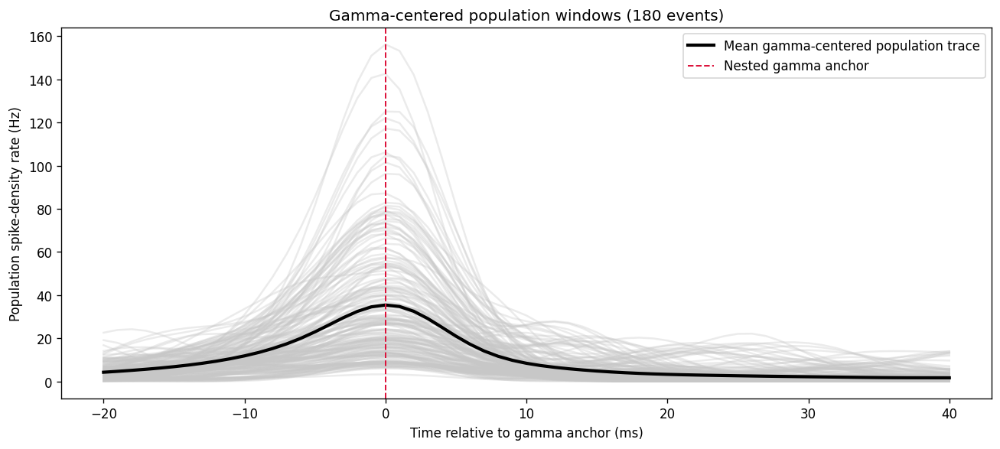

Valid gamma-centered windows: 180
Aligned tensor shape: (180, 300, 61)


In [98]:
pre_bins = int(round(ALIGN_PRE_MS / HIGHRES_BIN_MS))
post_bins = int(round(ALIGN_POST_MS / HIGHRES_BIN_MS))
relative_time_ms = (np.arange(-pre_bins, post_bins + 1) * HIGHRES_BIN_MS).astype(float)

time_centers_highres = highres_data["time_centers_s"]
population_rate_highres = highres_data["population_rate_hz"]
per_electrode_rate_highres = highres_data["per_electrode_rate_hz"]
selected_electrodes = highres_data["electrodes"]
spikes_by_electrode = highres_data["spikes_by_electrode"]

time_bin_half_width_s = 0.5 * float(HIGHRES_BIN_MS) / 1000.0
time_edges_highres = np.concatenate(
    ([float(time_centers_highres[0]) - time_bin_half_width_s], time_centers_highres + time_bin_half_width_s)
)
spike_presence_highres = []
for electrode in selected_electrodes:
    electrode_spike_times = np.asarray(spikes_by_electrode[int(electrode)], dtype=float)
    spike_counts_highres, _ = np.histogram(electrode_spike_times, bins=time_edges_highres)
    spike_presence_highres.append(spike_counts_highres > 0)
spike_presence_highres = np.asarray(spike_presence_highres, dtype=bool)

population_windows = []
aligned_tensor = []
aligned_spike_tensor = []
valid_nested_anchor_rows = []
for row in nested_anchors.itertuples(index=False):
    anchor_idx = int(np.argmin(np.abs(time_centers_highres - row.anchor_time_s)))
    window_start = anchor_idx - pre_bins
    window_stop = anchor_idx + post_bins + 1
    if window_start < 0 or window_stop > len(time_centers_highres):
        continue

    population_windows.append(population_rate_highres[window_start:window_stop])
    aligned_tensor.append(per_electrode_rate_highres[:, window_start:window_stop])
    aligned_spike_tensor.append(spike_presence_highres[:, window_start:window_stop])
    valid_nested_anchor_rows.append(row._asdict())

population_windows = np.asarray(population_windows, dtype=float)
aligned_tensor = np.asarray(aligned_tensor, dtype=float)
aligned_spike_tensor = np.asarray(aligned_spike_tensor, dtype=bool)
valid_nested_anchors = pd.DataFrame(valid_nested_anchor_rows)

fig, ax = plt.subplots(figsize=(11, 5))
for row in population_windows:
    ax.plot(relative_time_ms, row, color="0.78", alpha=0.35)
ax.plot(relative_time_ms, population_windows.mean(axis=0), color="black", lw=2.5, label="Mean gamma-centered population trace")
ax.axvline(0.0, color="crimson", ls="--", lw=1.2, label="Nested gamma anchor")
ax.set_xlabel("Time relative to gamma anchor (ms)")
ax.set_ylabel("Population spike-density rate (Hz)")
ax.set_title(f"Gamma-centered population windows ({len(valid_nested_anchors)} events)")
ax.legend(loc="upper right")
plt.tight_layout()
plt.show()

print(f"Valid gamma-centered windows: {len(valid_nested_anchors)}")
print(f"Aligned tensor shape: {aligned_tensor.shape}")



## Electrode-Conditional Propagation

The propagation heatmaps can be conditioned in two different ways, controlled by `COND_PROP_TRIGGER_SCOPE`:

- `"gamma"`: for each valid nested gamma event, treat every electrode that spikes within the globally parameterized gamma window as a possible source electrode, using that electrode's **first spike inside the gamma window** as the trigger
- `"macro_burst"`: ignore the nested gamma windows and instead use **every spike bin inside each coarse macro-burst epoch** as a possible source trigger

In both cases we accumulate two distance-by-delay heatmaps across all valid source-trigger instances:

- a **primary conditional probability** heatmap using binary target activation in each delay window
- a **secondary average IFR** heatmap using the same valid source-target trials



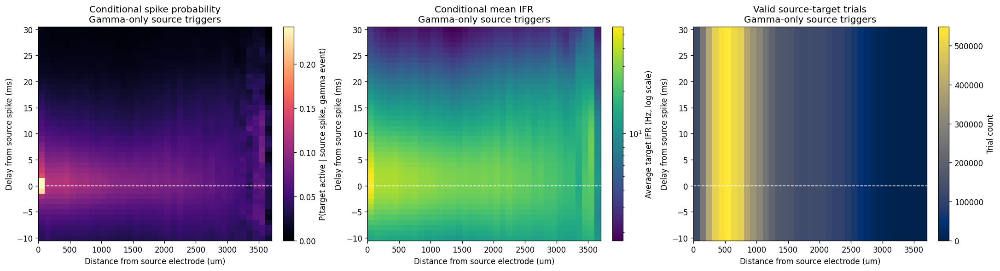

Source-trigger instances (gamma): 22,286
Delay bins: 41 | distance bins: 37


,window_idx,coarse_event_idx,gamma_peak_rank,source_index,source_electrode,source_trigger_idx,source_trigger_time_s,source_trigger_ms,source_trigger_reference,conditioning_scope
0,0,0,0,0,14020,2733,2.7335,-8.0,gamma_anchor,gamma
1,0,0,0,1,13801,2737,2.7375,-4.0,gamma_anchor,gamma
2,0,0,0,2,22701,2722,2.7225,-19.0,gamma_anchor,gamma
3,0,0,0,3,14021,2733,2.7335,-8.0,gamma_anchor,gamma
4,0,0,0,4,21083,2742,2.7425,1.0,gamma_anchor,gamma
5,0,0,0,5,23964,2727,2.7275,-14.0,gamma_anchor,gamma
6,0,0,0,6,21966,2730,2.7305,-11.0,gamma_anchor,gamma
7,0,0,0,7,22833,2741,2.7415,0.0,gamma_anchor,gamma
8,0,0,0,8,5220,2721,2.7215,-20.0,gamma_anchor,gamma
9,0,0,0,9,16012,2741,2.7415,0.0,gamma_anchor,gamma


In [99]:
if COND_PROP_TRIGGER_SCOPE not in {"gamma", "macro_burst"}:
    raise ValueError("COND_PROP_TRIGGER_SCOPE must be either 'gamma' or 'macro_burst'.")
if COND_PROP_TRIGGER_SCOPE == "gamma" and len(valid_nested_anchors) == 0:
    raise ValueError("No valid gamma-centered windows were available for conditional propagation analysis.")
if COND_PROP_TRIGGER_SCOPE == "macro_burst" and coarse_epochs.empty:
    raise ValueError("No coarse burst epochs were available for macro-burst conditional propagation analysis.")

prop_layout_df = pd.DataFrame(rec.layout).drop_duplicates("electrode").copy()
prop_layout_df = prop_layout_df[prop_layout_df["electrode"].isin(selected_electrodes)].copy()
prop_layout_df = prop_layout_df.set_index("electrode").loc[selected_electrodes].reset_index()

prop_coords = prop_layout_df[["x", "y"]].to_numpy(dtype=float)
dx = prop_coords[:, 0][:, None] - prop_coords[:, 0][None, :]
dy = prop_coords[:, 1][:, None] - prop_coords[:, 1][None, :]
distance_matrix_um = np.sqrt(dx**2 + dy**2)

max_pair_distance_um = float(distance_matrix_um[~np.eye(distance_matrix_um.shape[0], dtype=bool)].max())
distance_edges_um = np.arange(0.0, max_pair_distance_um + COND_PROP_DISTANCE_BIN_UM, COND_PROP_DISTANCE_BIN_UM, dtype=float)
if distance_edges_um.size < 2 or distance_edges_um[-1] <= max_pair_distance_um:
    distance_edges_um = np.append(distance_edges_um, distance_edges_um[-1] + COND_PROP_DISTANCE_BIN_UM if distance_edges_um.size else COND_PROP_DISTANCE_BIN_UM)
distance_centers_um = 0.5 * (distance_edges_um[:-1] + distance_edges_um[1:])

pair_distance_bin_idx = np.digitize(distance_matrix_um, distance_edges_um, right=False) - 1
pair_distance_bin_idx[pair_distance_bin_idx >= len(distance_centers_um)] = len(distance_centers_um) - 1
np.fill_diagonal(pair_distance_bin_idx, -1)

delay_centers_ms = np.arange(
    COND_PROP_DELAY_START_MS,
    COND_PROP_DELAY_STOP_MS + 0.5 * HIGHRES_BIN_MS,
    HIGHRES_BIN_MS,
    dtype=float,
)
delay_edges_ms = np.concatenate(([delay_centers_ms[0] - 0.5 * HIGHRES_BIN_MS], delay_centers_ms + 0.5 * HIGHRES_BIN_MS))
delay_offsets_bins = np.rint(delay_centers_ms / HIGHRES_BIN_MS).astype(int)
cond_half_window_bins = max(0, int(round(COND_PROP_WINDOW_HALF_WIDTH_MS / HIGHRES_BIN_MS)))

n_delay = len(delay_centers_ms)
n_dist = len(distance_centers_um)
cond_success_counts = np.zeros((n_delay, n_dist), dtype=float)
cond_trial_counts = np.zeros((n_delay, n_dist), dtype=float)
cond_ifr_sums = np.zeros((n_delay, n_dist), dtype=float)
source_trigger_rows = []
cond_scope_title = "Gamma-only source triggers" if COND_PROP_TRIGGER_SCOPE == "gamma" else "All spike triggers inside coarse macro bursts"
cond_scope_label = "gamma event" if COND_PROP_TRIGGER_SCOPE == "gamma" else "macro burst"

if COND_PROP_TRIGGER_SCOPE == "gamma":
    for event_idx, row in enumerate(valid_nested_anchors.itertuples(index=False)):
        anchor_idx = int(np.argmin(np.abs(time_centers_highres - row.anchor_time_s)))
        window_start = anchor_idx - pre_bins
        window_stop = anchor_idx + post_bins + 1
        if window_start < 0 or window_stop > spike_presence_highres.shape[1]:
            continue

        event_spikes = spike_presence_highres[:, window_start:window_stop]
        active_sources = np.flatnonzero(event_spikes.any(axis=1))
        if active_sources.size == 0:
            continue

        first_spike_idx = np.argmax(event_spikes[active_sources], axis=1)
        for local_src_idx, src_idx in enumerate(active_sources):
            rel_trigger_idx = int(first_spike_idx[local_src_idx])
            abs_trigger_idx = int(window_start + rel_trigger_idx)
            source_trigger_rows.append(
                {
                    "window_idx": int(event_idx),
                    "coarse_event_idx": int(row.coarse_event_idx),
                    "gamma_peak_rank": int(row.gamma_peak_rank),
                    "source_index": int(src_idx),
                    "source_electrode": int(selected_electrodes[src_idx]),
                    "source_trigger_idx": abs_trigger_idx,
                    "source_trigger_time_s": float(time_centers_highres[abs_trigger_idx]),
                    "source_trigger_ms": float(relative_time_ms[rel_trigger_idx]),
                    "source_trigger_reference": "gamma_anchor",
                    "conditioning_scope": COND_PROP_TRIGGER_SCOPE,
                }
            )
else:
    for row in coarse_epochs.itertuples(index=False):
        epoch_idx = np.flatnonzero((time_centers_highres >= float(row.start_time_s)) & (time_centers_highres <= float(row.end_time_s)))
        if epoch_idx.size == 0:
            continue
        epoch_start_idx = int(epoch_idx[0])
        epoch_stop_idx = int(epoch_idx[-1]) + 1
        epoch_spikes = spike_presence_highres[:, epoch_start_idx:epoch_stop_idx]
        active_sources = np.flatnonzero(epoch_spikes.any(axis=1))
        if active_sources.size == 0:
            continue

        for src_idx in active_sources:
            rel_trigger_idx = np.flatnonzero(epoch_spikes[src_idx])
            for rel_idx in rel_trigger_idx:
                abs_trigger_idx = int(epoch_start_idx + int(rel_idx))
                source_trigger_rows.append(
                    {
                        "window_idx": -1,
                        "coarse_event_idx": int(row.event_idx),
                        "gamma_peak_rank": -1,
                        "source_index": int(src_idx),
                        "source_electrode": int(selected_electrodes[src_idx]),
                        "source_trigger_idx": abs_trigger_idx,
                        "source_trigger_time_s": float(time_centers_highres[abs_trigger_idx]),
                        "source_trigger_ms": float((time_centers_highres[abs_trigger_idx] - float(row.coarse_peak_time_s)) * 1000.0),
                        "source_trigger_reference": "coarse_peak",
                        "conditioning_scope": COND_PROP_TRIGGER_SCOPE,
                    }
                )

source_trigger_summary = pd.DataFrame(source_trigger_rows)
if source_trigger_summary.empty:
    raise ValueError(f"No source triggers were available for scope={COND_PROP_TRIGGER_SCOPE!r}.")

for trigger_row in source_trigger_summary.itertuples(index=False):
    src_idx = int(trigger_row.source_index)
    abs_trigger_idx = int(trigger_row.source_trigger_idx)
    target_bins = pair_distance_bin_idx[src_idx]
    valid_target_idx = np.flatnonzero(target_bins >= 0)
    if valid_target_idx.size == 0:
        continue
    target_bin_idx = target_bins[valid_target_idx]

    for delay_i, offset_bins in enumerate(delay_offsets_bins):
        center_idx = abs_trigger_idx + int(offset_bins)
        start_idx = center_idx - cond_half_window_bins
        stop_idx = center_idx + cond_half_window_bins + 1
        if start_idx < 0 or stop_idx > spike_presence_highres.shape[1]:
            continue

        target_window_spikes = spike_presence_highres[valid_target_idx, start_idx:stop_idx]
        target_window_ifr = per_electrode_rate_highres[valid_target_idx, start_idx:stop_idx].mean(axis=1)
        target_success = target_window_spikes.any(axis=1).astype(float)

        cond_trial_counts[delay_i] += np.bincount(target_bin_idx, minlength=n_dist).astype(float)
        cond_success_counts[delay_i] += np.bincount(target_bin_idx, weights=target_success, minlength=n_dist)
        cond_ifr_sums[delay_i] += np.bincount(target_bin_idx, weights=target_window_ifr, minlength=n_dist)

with np.errstate(divide="ignore", invalid="ignore"):
    conditional_probability = np.divide(
        cond_success_counts,
        cond_trial_counts,
        out=np.full_like(cond_success_counts, np.nan),
        where=cond_trial_counts > 0,
    )
    conditional_mean_ifr = np.divide(
        cond_ifr_sums,
        cond_trial_counts,
        out=np.full_like(cond_ifr_sums, np.nan),
        where=cond_trial_counts > 0,
    )

prob_finite = conditional_probability[np.isfinite(conditional_probability)]
prob_vmax = float(prob_finite.max()) if prob_finite.size else 1.0
prob_vmax = max(prob_vmax, 1e-3)
ifr_positive = conditional_mean_ifr[np.isfinite(conditional_mean_ifr) & (conditional_mean_ifr > 0)]
ifr_vmin = float(ifr_positive.min()) if ifr_positive.size else 1e-2
ifr_vmax = float(ifr_positive.max()) if ifr_positive.size else 1.0
ifr_vmax = max(ifr_vmax, ifr_vmin * (1.0 + 1e-6))
count_positive = cond_trial_counts[cond_trial_counts > 0]
count_vmax = float(count_positive.max()) if count_positive.size else 1.0

distance_grid_um, delay_grid_ms = np.meshgrid(distance_centers_um, delay_centers_ms)
prob_surface = np.nan_to_num(conditional_probability, nan=0.0)
ifr_surface = np.nan_to_num(np.clip(conditional_mean_ifr, ifr_vmin, ifr_vmax), nan=ifr_vmin)
ifr_surface_log10 = np.log10(np.clip(ifr_surface, ifr_vmin, ifr_vmax))
count_surface = np.nan_to_num(cond_trial_counts, nan=0.0)

fig, (ax00, ax01, ax02) = plt.subplots(1, 3, figsize=(18, 4.8), constrained_layout=True)

im0 = ax00.imshow(
    conditional_probability,
    aspect="auto",
    origin="lower",
    extent=[distance_edges_um[0], distance_edges_um[-1], delay_edges_ms[0], delay_edges_ms[-1]],
    cmap="magma",
    vmin=0.0,
    vmax=prob_vmax,
)
ax00.axhline(0.0, color="white", ls="--", lw=1.0)
ax00.set_xlabel("Distance from source electrode (um)")
ax00.set_ylabel("Delay from source spike (ms)")
ax00.set_title(f"Conditional spike probability\n{cond_scope_title}")
cbar0 = fig.colorbar(im0, ax=ax00)
cbar0.set_label(f"P(target active | source spike, {cond_scope_label})")

im1 = ax01.imshow(
    np.clip(conditional_mean_ifr, ifr_vmin, ifr_vmax),
    aspect="auto",
    origin="lower",
    extent=[distance_edges_um[0], distance_edges_um[-1], delay_edges_ms[0], delay_edges_ms[-1]],
    cmap="viridis",
    norm=LogNorm(vmin=ifr_vmin, vmax=ifr_vmax),
)
ax01.axhline(0.0, color="white", ls="--", lw=1.0)
ax01.set_xlabel("Distance from source electrode (um)")
ax01.set_ylabel("Delay from source spike (ms)")
ax01.set_title(f"Conditional mean IFR\n{cond_scope_title}")
cbar1 = fig.colorbar(im1, ax=ax01)
cbar1.set_label("Average target IFR (Hz, log scale)")
cbar1.locator = LogLocator(base=10)
cbar1.formatter = LogFormatterMathtext(base=10)
cbar1.update_ticks()

im2 = ax02.imshow(
    cond_trial_counts,
    aspect="auto",
    origin="lower",
    extent=[distance_edges_um[0], distance_edges_um[-1], delay_edges_ms[0], delay_edges_ms[-1]],
    cmap="cividis",
    vmin=0.0,
    vmax=count_vmax,
)
ax02.axhline(0.0, color="white", ls="--", lw=1.0)
ax02.set_xlabel("Distance from source electrode (um)")
ax02.set_ylabel("Delay from source spike (ms)")
ax02.set_title(f"Valid source-target trials\n{cond_scope_title}")
cbar2 = fig.colorbar(im2, ax=ax02)
cbar2.set_label("Trial count")

plt.show()

ifr_tick_exponents = np.arange(
    int(np.floor(np.log10(ifr_vmin))),
    int(np.ceil(np.log10(ifr_vmax))) + 1,
)
ifr_tickvals = ifr_tick_exponents.astype(float)
ifr_ticktext = [f"10^{int(exp)}" for exp in ifr_tick_exponents]
plotly_camera = dict(eye=dict(x=1.6, y=-1.8, z=0.9))

interactive_surface_fig = make_subplots(
    rows=1,
    cols=3,
    specs=[[{"type": "surface"}, {"type": "surface"}, {"type": "surface"}]],
    subplot_titles=(
        f"Conditional spike probability surface<br>{cond_scope_title}",
        f"Conditional mean IFR surface<br>{cond_scope_title}",
        f"Valid source-target trials surface<br>{cond_scope_title}",
    ),
    horizontal_spacing=0.03,
)

interactive_surface_fig.add_trace(
    go.Surface(
        x=distance_grid_um,
        y=delay_grid_ms,
        z=prob_surface,
        colorscale="Magma",
        cmin=0.0,
        cmax=prob_vmax,
        colorbar=dict(title="Probability", x=0.30),
        hovertemplate="Distance: %{x:.0f} um<br>Delay: %{y:.1f} ms<br>Probability: %{z:.4f}<extra></extra>",
    ),
    row=1,
    col=1,
)

interactive_surface_fig.add_trace(
    go.Surface(
        x=distance_grid_um,
        y=delay_grid_ms,
        z=ifr_surface,
        surfacecolor=ifr_surface_log10,
        colorscale="Viridis",
        cmin=float(np.log10(ifr_vmin)),
        cmax=float(np.log10(ifr_vmax)),
        colorbar=dict(title="Mean IFR (Hz)", x=0.645, tickvals=ifr_tickvals.tolist(), ticktext=ifr_ticktext),
        hovertemplate="Distance: %{x:.0f} um<br>Delay: %{y:.1f} ms<br>Mean IFR: %{z:.2f} Hz<extra></extra>",
    ),
    row=1,
    col=2,
)

interactive_surface_fig.add_trace(
    go.Surface(
        x=distance_grid_um,
        y=delay_grid_ms,
        z=count_surface,
        colorscale="Cividis",
        cmin=0.0,
        cmax=count_vmax,
        colorbar=dict(title="Trial count", x=0.99),
        hovertemplate="Distance: %{x:.0f} um<br>Delay: %{y:.1f} ms<br>Trials: %{z:.0f}<extra></extra>",
    ),
    row=1,
    col=3,
)

interactive_surface_fig.update_layout(
    template="plotly_white",
    width=1800,
    height=560,
    margin=dict(l=20, r=20, t=70, b=20),
)
interactive_surface_fig.update_scenes(
    xaxis_title="Distance (um)",
    yaxis_title="Delay (ms)",
    zaxis_title="Probability",
    camera=plotly_camera,
    aspectmode="manual",
    aspectratio=dict(x=1.5, y=1.0, z=0.8),
    row=1,
    col=1,
)
interactive_surface_fig.update_scenes(
    xaxis_title="Distance (um)",
    yaxis_title="Delay (ms)",
    zaxis_title="Mean IFR (Hz)",
    camera=plotly_camera,
    aspectmode="manual",
    aspectratio=dict(x=1.5, y=1.0, z=0.8),
    row=1,
    col=2,
)
interactive_surface_fig.update_scenes(
    xaxis_title="Distance (um)",
    yaxis_title="Delay (ms)",
    zaxis_title="Trial count",
    camera=plotly_camera,
    aspectmode="manual",
    aspectratio=dict(x=1.5, y=1.0, z=0.8),
    row=1,
    col=3,
)
display(interactive_surface_fig)

print(f"Source-trigger instances ({COND_PROP_TRIGGER_SCOPE}): {len(source_trigger_summary):,}")
print(f"Delay bins: {len(delay_centers_ms)} | distance bins: {len(distance_centers_um)}")

source_trigger_summary.head(20)



## Example Gamma-Centered IFR Time Series
Before averaging across events, inspect a small set of individual gamma-centered windows using the exact same `ALIGN_PRE_MS` / `ALIGN_POST_MS` alignment used in the overlay below. By default, the notebook shows the strongest nested gamma anchors by `anchor_height_hz`.



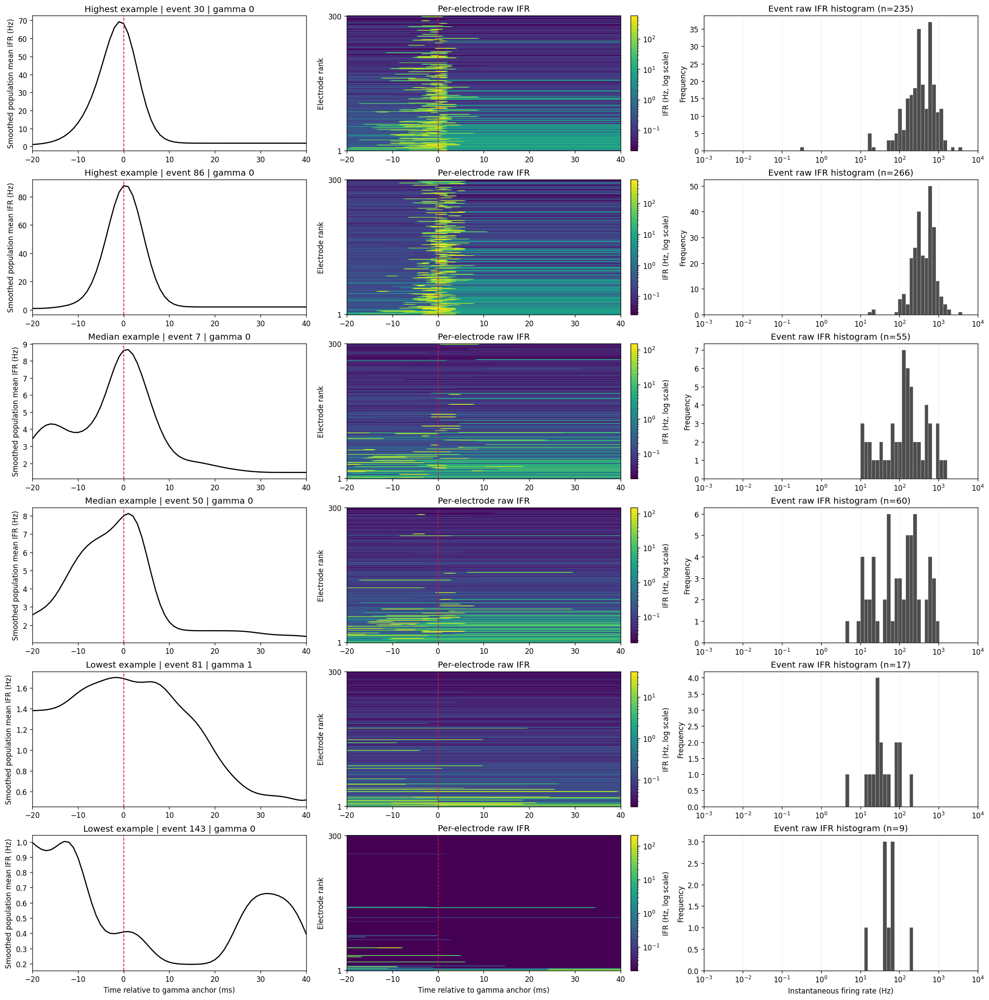

,coarse_event_idx,gamma_peak_rank,anchor_time_s,anchor_height_hz,gamma_anchor_delay_ms,subpeak_count,selection_band
0,30,0,124.208,142.616,10.0,1,highest
1,86,0,373.230,156.246,8.0,1,highest
2,7,0,34.567,26.829,26.0,1,median
3,50,0,222.761,26.759,24.0,1,median
4,81,1,347.590,6.158,155.0,1,lowest
5,143,0,598.592,3.296,52.0,1,lowest


In [100]:
if len(valid_nested_anchors) == 0:
    raise ValueError("No valid gamma-centered windows were available for event-level inspection.")

raw_ifr_data, _, _ = calculate_ifr(
    rec.spikes,
    refs,
    rec.start_time,
    rec.end_time,
)

selected_electrodes = np.asarray(refs, dtype=int)
spike_times_all = np.asarray(rec.spikes["time"], dtype=float)
spike_electrodes_all = np.asarray(rec.spikes["electrode"], dtype=int)
time_bin_half_width_s = 0.5 * float(HIGHRES_BIN_MS) / 1000.0
time_edges_highres = np.concatenate(
    ([float(time_centers_highres[0]) - time_bin_half_width_s], time_centers_highres + time_bin_half_width_s)
)

raw_ifr_highres = []
spike_presence_highres = []
event_interval_midpoints = {}
event_interval_ifr = {}
for electrode in selected_electrodes:
    if int(electrode) in raw_ifr_data:
        ifr_times, ifr_values = raw_ifr_data[int(electrode)]
        value_idx = np.searchsorted(ifr_times, time_centers_highres, side="right") - 1
        value_idx = np.clip(value_idx, 0, len(ifr_values) - 1)
        raw_ifr_highres.append(ifr_values[value_idx])
    else:
        raw_ifr_highres.append(np.zeros_like(time_centers_highres, dtype=float))

    electrode_spike_times = np.sort(
        spike_times_all[
            (spike_electrodes_all == int(electrode))
            & (spike_times_all >= rec.start_time)
            & (spike_times_all <= rec.end_time)
        ]
    )
    spike_counts_highres, _ = np.histogram(electrode_spike_times, bins=time_edges_highres)
    spike_presence_highres.append(spike_counts_highres > 0)

    if electrode_spike_times.size < 2:
        event_interval_midpoints[int(electrode)] = np.array([], dtype=float)
        event_interval_ifr[int(electrode)] = np.array([], dtype=float)
    else:
        isi_s = np.diff(electrode_spike_times)
        valid_isi = isi_s > 0
        event_interval_midpoints[int(electrode)] = 0.5 * (
            electrode_spike_times[:-1][valid_isi] + electrode_spike_times[1:][valid_isi]
        )
        event_interval_ifr[int(electrode)] = 1.0 / isi_s[valid_isi]

raw_ifr_highres = np.asarray(raw_ifr_highres, dtype=float)
population_mean_raw_ifr = raw_ifr_highres.mean(axis=0)
population_mean_raw_ifr_smooth = gaussian_filter1d(
    population_mean_raw_ifr,
    sigma=max(1e-6, float(HIGHRES_SMOOTH_SIGMA_MS) / float(HIGHRES_BIN_MS)),
    mode="nearest",
)
spike_presence_highres = np.asarray(spike_presence_highres, dtype=bool)
aligned_spike_tensor = []
for row in valid_nested_anchors.itertuples(index=False):
    anchor_idx = int(np.argmin(np.abs(time_centers_highres - row.anchor_time_s)))
    window_start = anchor_idx - pre_bins
    window_stop = anchor_idx + post_bins + 1
    if window_start < 0 or window_stop > len(time_centers_highres):
        continue
    aligned_spike_tensor.append(spike_presence_highres[:, window_start:window_stop])
aligned_spike_tensor = np.asarray(aligned_spike_tensor, dtype=bool)

all_interval_ifr = raw_ifr_highres[raw_ifr_highres > 0].astype(float)
if all_interval_ifr.size == 0:
    raise ValueError("No positive raw IFR values were found for the selected electrodes.")
global_log_bins = np.linspace(
    float(np.log10(np.clip(all_interval_ifr, 1e-12, None)).min()),
    float(np.log10(np.clip(all_interval_ifr, 1e-12, None)).max()),
    60,
)

example_event_count = min(int(EXAMPLE_GAMMA_EVENT_COUNT), len(valid_nested_anchors))
anchor_heights = valid_nested_anchors["anchor_height_hz"].to_numpy(dtype=float)
sorted_indices = np.argsort(anchor_heights)

highest_candidates = [int(idx) for idx in sorted_indices[::-1][:2]]
median_center = len(sorted_indices) // 2
median_start = max(0, median_center - 1)
median_stop = min(len(sorted_indices), median_start + 2)
median_candidates = [int(idx) for idx in sorted_indices[median_start:median_stop]]
lowest_candidates = [int(idx) for idx in sorted_indices[:2]]

example_indices = []
selection_labels = {}
for band_name, candidates in [("highest", highest_candidates), ("median", median_candidates), ("lowest", lowest_candidates)]:
    for idx in candidates:
        if idx not in example_indices:
            example_indices.append(idx)
            selection_labels[idx] = band_name

if len(example_indices) < example_event_count:
    for idx in sorted_indices[::-1]:
        idx = int(idx)
        if idx not in example_indices:
            example_indices.append(idx)
            selection_labels[idx] = "additional"
        if len(example_indices) >= example_event_count:
            break

example_indices = np.asarray(example_indices[:example_event_count], dtype=int)
example_events = valid_nested_anchors.iloc[example_indices].copy()
example_events["window_idx"] = example_indices
example_events["selection_band"] = [selection_labels[int(idx)] for idx in example_indices]
example_events["selection_band"] = pd.Categorical(
    example_events["selection_band"],
    categories=["highest", "median", "lowest", "additional"],
    ordered=True,
)
example_events = example_events.sort_values(["selection_band", "coarse_event_idx", "gamma_peak_rank"]).reset_index(drop=True)

fig, axes = plt.subplots(
    example_event_count,
    3,
    figsize=(19, max(3.2 * example_event_count, 4.0)),
    constrained_layout=True,
    squeeze=False,
)

for row_idx, row in enumerate(example_events.itertuples(index=False)):
    anchor_idx = int(np.argmin(np.abs(time_centers_highres - row.anchor_time_s)))
    window_start = anchor_idx - pre_bins
    window_stop = anchor_idx + post_bins + 1
    if window_start < 0 or window_stop > len(time_centers_highres):
        continue

    electrode_window = raw_ifr_highres[:, window_start:window_stop]
    pop_trace = population_mean_raw_ifr_smooth[window_start:window_stop]
    absolute_window_start = float(time_centers_highres[window_start])
    absolute_window_stop = float(time_centers_highres[window_stop - 1])
    event_interval_ifr_samples = []
    for electrode in selected_electrodes:
        mids = event_interval_midpoints[int(electrode)]
        vals = event_interval_ifr[int(electrode)]
        in_window = (mids >= absolute_window_start) & (mids <= absolute_window_stop)
        if np.any(in_window):
            event_interval_ifr_samples.append(vals[in_window])
    event_interval_ifr_samples = (
        np.concatenate(event_interval_ifr_samples).astype(float)
        if event_interval_ifr_samples
        else np.array([], dtype=float)
    )

    ax_line = axes[row_idx, 0]
    ax_heat = axes[row_idx, 1]
    ax_hist = axes[row_idx, 2]

    ax_line.plot(relative_time_ms, pop_trace, color="black", lw=1.6)
    ax_line.axvline(0.0, color="crimson", ls="--", lw=1.1)
    ax_line.set_ylabel("Smoothed population mean IFR (Hz)")
    ax_line.set_title(
        f"{str(row.selection_band).title()} example | event {int(row.coarse_event_idx)} | gamma {int(row.gamma_peak_rank)}"
    )
    ax_line.set_xlim(float(relative_time_ms[0]), float(relative_time_ms[-1]))

    positive_vals = electrode_window[electrode_window > 0]
    if positive_vals.size == 0:
        heat_vmin = 1e-3
        heat_vmax = 1.0
    else:
        heat_vmin = max(1e-3, float(np.quantile(positive_vals, 0.02)))
        heat_vmax = max(heat_vmin * 10.0, float(np.quantile(positive_vals, 0.995)))
    display_window = np.clip(electrode_window, heat_vmin, heat_vmax)

    im = ax_heat.imshow(
        display_window,
        aspect="auto",
        origin="lower",
        extent=[float(relative_time_ms[0]), float(relative_time_ms[-1]), 0.5, electrode_window.shape[0] + 0.5],
        cmap="viridis",
        norm=LogNorm(vmin=heat_vmin, vmax=heat_vmax),
    )
    ax_heat.axvline(0.0, color="crimson", ls="--", lw=1.0)
    ax_heat.set_title("Per-electrode raw IFR")
    ax_heat.set_ylabel("Electrode rank")
    ax_heat.set_yticks([1, electrode_window.shape[0]])
    ax_heat.set_xlim(float(relative_time_ms[0]), float(relative_time_ms[-1]))

    if event_interval_ifr_samples.size > 0:
        event_log_ifr = np.log10(np.clip(event_interval_ifr_samples, 1e-12, None))
        ax_hist.hist(
            event_log_ifr,
            bins=global_log_bins,
            color="0.30",
            edgecolor="white",
            linewidth=0.25,
        )
    ax_hist.set_title(f"Event raw IFR histogram (n={int(event_interval_ifr_samples.size)})")
    ax_hist.set_ylabel("Frequency")
    ax_hist.grid(True, axis="x", alpha=0.18)
    hist_ticks = ax_hist.get_xticks()
    ax_hist.set_xticks(hist_ticks)
    ax_hist.set_xticklabels(
        [f"$10^{{{int(x)}}}$" if float(x).is_integer() else f"$10^{{{x:.1f}}}$" for x in hist_ticks],
        rotation=0,
    )

    if row_idx == example_event_count - 1:
        ax_line.set_xlabel("Time relative to gamma anchor (ms)")
        ax_heat.set_xlabel("Time relative to gamma anchor (ms)")
        ax_hist.set_xlabel("Instantaneous firing rate (Hz)")

    cbar = fig.colorbar(im, ax=ax_heat, fraction=0.046, pad=0.02)
    cbar.set_label("IFR (Hz, log scale)")
    cbar.locator = LogLocator(base=10)
    cbar.formatter = LogFormatterMathtext(base=10)
    cbar.update_ticks()

plt.show()

example_events[[
    "coarse_event_idx",
    "gamma_peak_rank",
    "anchor_time_s",
    "anchor_height_hz",
    "gamma_anchor_delay_ms",
    "subpeak_count",
    "selection_band",
]].round(3)



## Example Event Hex-Tiled GIFs
Use the same event selection as the example gamma-centered IFR section, but render each event as its own hex-tiled propagation GIF. The frame timing, hex-grid size, and log-scale rendering match the later average-array GIF section. GIF saving is optional; when disabled, preview files are written to a temporary directory for display only.



Highest example | event 30 | gamma 0: /tmp/ephax_example_event_hex/well5_event30_gamma0_highest.gif


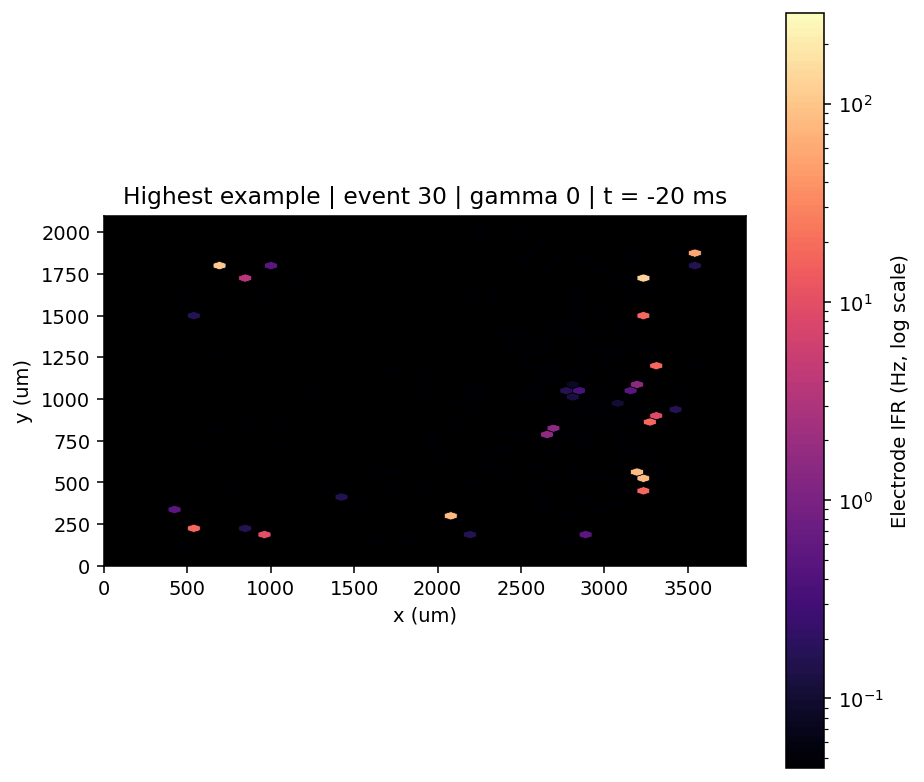

Highest example | event 86 | gamma 0: /tmp/ephax_example_event_hex/well5_event86_gamma0_highest.gif


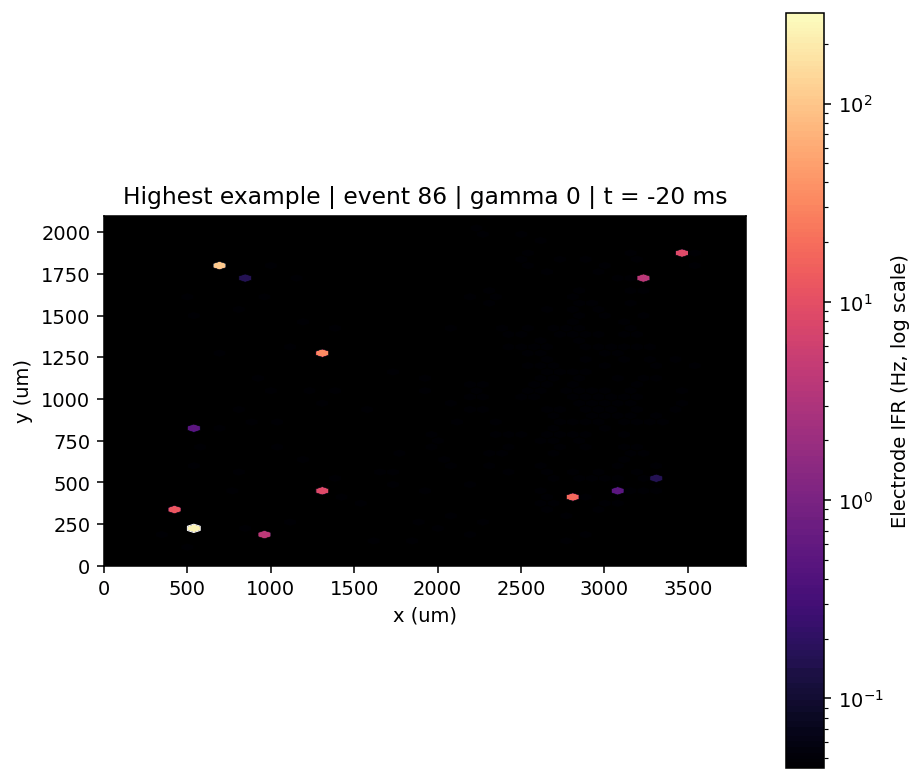

Median example | event 7 | gamma 0: /tmp/ephax_example_event_hex/well5_event7_gamma0_median.gif


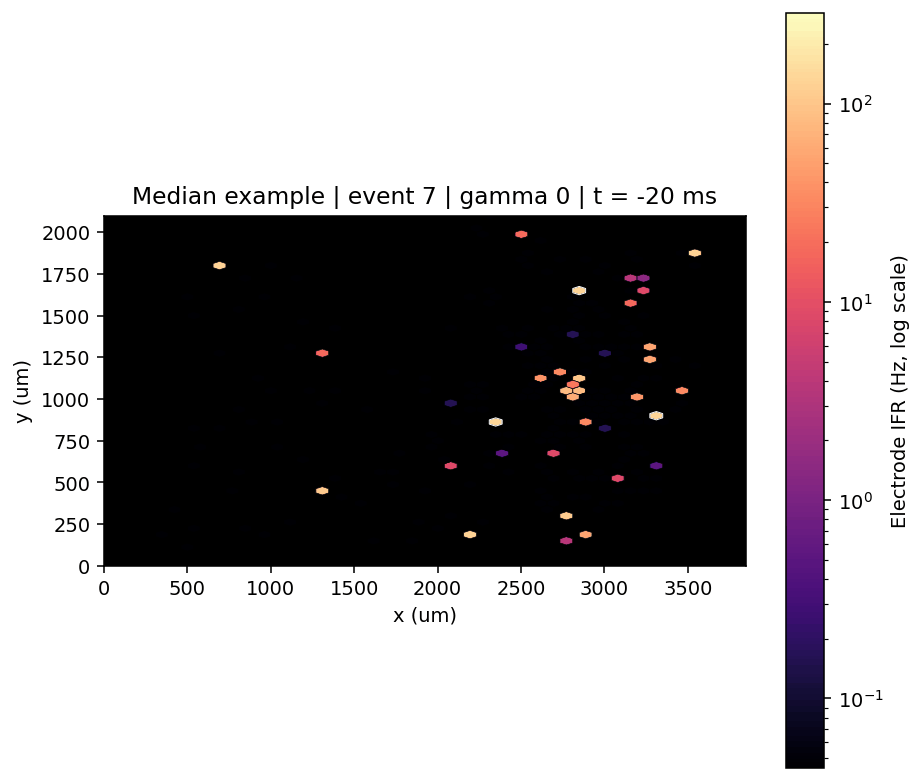

Median example | event 50 | gamma 0: /tmp/ephax_example_event_hex/well5_event50_gamma0_median.gif


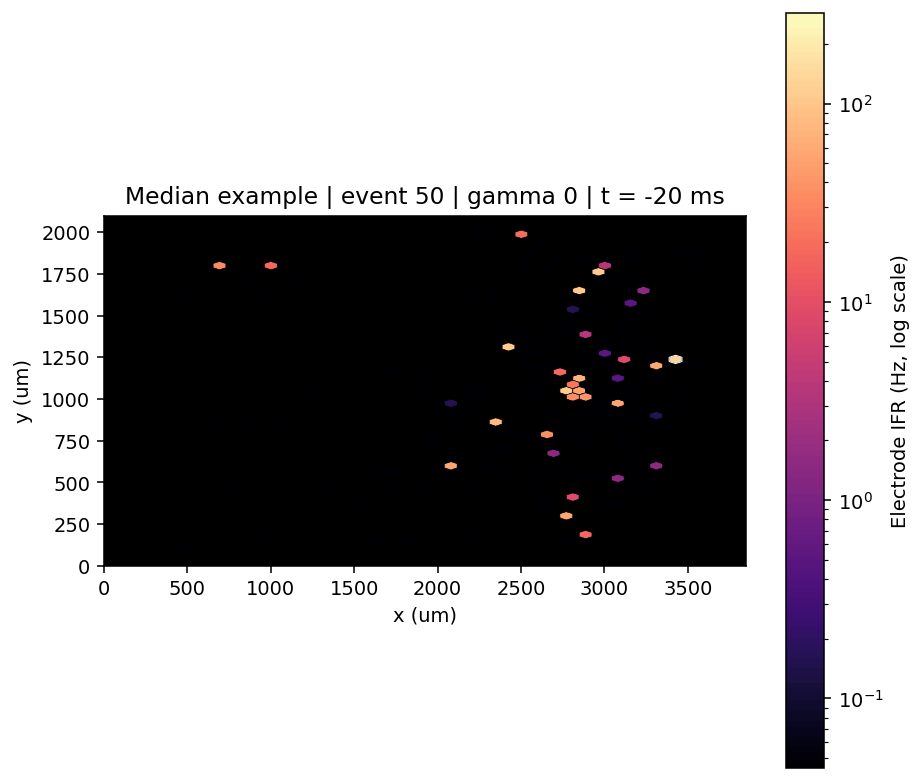

Lowest example | event 81 | gamma 1: /tmp/ephax_example_event_hex/well5_event81_gamma1_lowest.gif


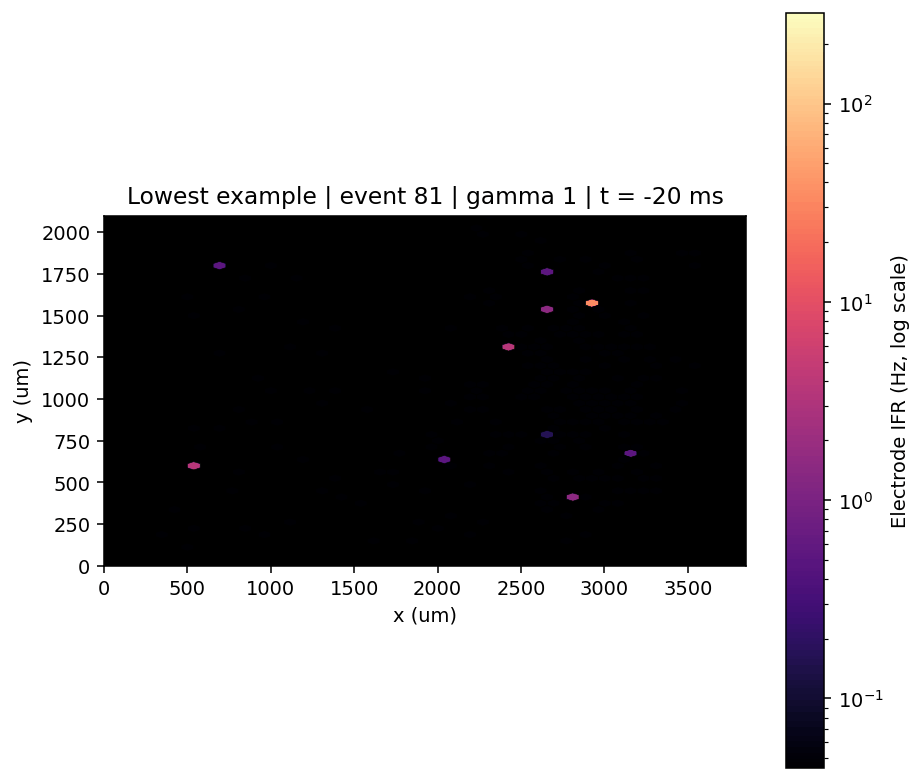

Lowest example | event 143 | gamma 0: /tmp/ephax_example_event_hex/well5_event143_gamma0_lowest.gif


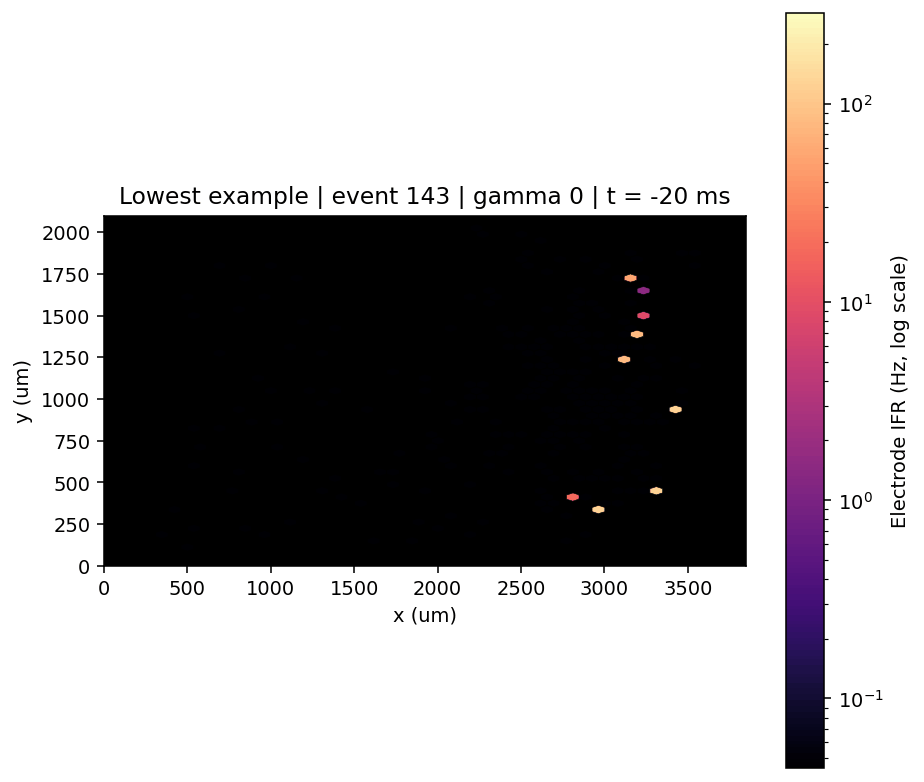

In [108]:
example_hex_dir = (repo_root / EXAMPLE_EVENT_HEX_DIR) if EXAMPLE_EVENT_HEX_SAVE else (Path('/tmp') / 'ephax_example_event_hex')
example_hex_dir.mkdir(parents=True, exist_ok=True)

example_frame_step = max(1, int(round(GIF_FRAME_STEP_MS / HIGHRES_BIN_MS)))
example_frame_indices = np.arange(0, len(relative_time_ms), example_frame_step, dtype=int)

example_full_layout_df = pd.DataFrame(rec.layout).drop_duplicates("electrode").copy()
example_layout_df = example_full_layout_df[example_full_layout_df["electrode"].isin(selected_electrodes)].copy()
example_hex_x = example_layout_df["x"].to_numpy(dtype=float)
example_hex_y = example_layout_df["y"].to_numpy(dtype=float)
example_hex_electrodes = example_layout_df["electrode"].to_numpy(dtype=int)
example_hex_idx = np.array([np.flatnonzero(selected_electrodes == int(el))[0] for el in example_hex_electrodes], dtype=int)
example_xlim = (ARRAY_X_MIN_UM, ARRAY_X_MAX_UM)
example_ylim = (ARRAY_Y_MIN_UM, ARRAY_Y_MAX_UM)
example_box_aspect = (example_ylim[1] - example_ylim[0]) / max(example_xlim[1] - example_xlim[0], 1e-9)
example_hex_extent = (*example_xlim, *example_ylim)

example_positive = aligned_tensor[aligned_tensor > 0]
if example_positive.size == 0:
    raise ValueError("No positive values were available for event-wise hex GIFs.")
example_vmin = max(1e-2, float(np.quantile(example_positive, 0.05)))
example_vmax = max(example_vmin * 10.0, float(np.quantile(example_positive, 0.995)))

example_event_gif_paths = []
for row in example_events.itertuples(index=False):
    window_idx = int(row.window_idx)
    if window_idx < 0 or window_idx >= len(aligned_tensor):
        continue
    event_tensor = aligned_tensor[window_idx]
    band_label = str(row.selection_band)
    gif_name = f"well{WELL}_event{int(row.coarse_event_idx)}_gamma{int(row.gamma_peak_rank)}_{band_label}.gif"
    gif_path = example_hex_dir / gif_name

    event_spike_tensor = aligned_spike_tensor[window_idx]

    with imageio.get_writer(gif_path, mode="I", duration=0.14) as writer:
        for time_index in example_frame_indices:
            values = event_tensor[example_hex_idx, int(time_index)]
            spike_mask = event_spike_tensor[example_hex_idx, int(time_index)]
            fig, ax = plt.subplots(figsize=(7.4, 7.0))
            hb = ax.hexbin(
                example_hex_x,
                example_hex_y,
                C=np.clip(values, example_vmin, example_vmax),
                reduce_C_function=np.mean,
                gridsize=HEX_GRID_SIZE,
                cmap="magma",
                mincnt=1,
                linewidths=0.35,
                edgecolors="black",
                norm=LogNorm(vmin=example_vmin, vmax=example_vmax),
                extent=example_hex_extent,
            )
            if np.any(spike_mask):
                spike_hb = ax.hexbin(
                    example_hex_x[spike_mask],
                    example_hex_y[spike_mask],
                    gridsize=HEX_GRID_SIZE,
                    mincnt=1,
                    linewidths=0.35,
                    edgecolors="white",
                    facecolors="none",
                    extent=example_hex_extent,
                )
                spike_hb.set_facecolor("none")
                spike_hb.set_edgecolor("white")
                spike_hb.set_linewidth(0.5)
            ax.set_facecolor("black")
            ax.set_xlim(*example_xlim)
            ax.set_ylim(*example_ylim)
            ax.set_xlabel("x (um)")
            ax.set_ylabel("y (um)")
            ax.set_aspect("equal", adjustable="box")
            ax.set_box_aspect(example_box_aspect)
            ax.set_title(
                f"{band_label.title()} example | event {int(row.coarse_event_idx)} | gamma {int(row.gamma_peak_rank)} | t = {relative_time_ms[time_index]:.0f} ms"
            )
            cbar = fig.colorbar(hb, ax=ax, label="Electrode IFR (Hz, log scale)")
            cbar.locator = LogLocator(base=10)
            cbar.formatter = LogFormatterMathtext(base=10)
            cbar.update_ticks()
            buf = BytesIO()
            fig.savefig(buf, format="png", dpi=140, bbox_inches="tight")
            buf.seek(0)
            writer.append_data(imageio.imread(buf))
            buf.close()
            plt.close(fig)

    example_event_gif_paths.append((band_label, int(row.coarse_event_idx), int(row.gamma_peak_rank), gif_path))

for band_label, coarse_event_idx, gamma_peak_rank, gif_path in example_event_gif_paths:
    print(f"{band_label.title()} example | event {coarse_event_idx} | gamma {gamma_peak_rank}: {gif_path}")
    display(Image(filename=str(gif_path)))



## Gamma-Centered Propagation Summary

Average the high-resolution, per-electrode spike-density traces across all valid nested anchors and sort electrodes by how strongly they fire around the gamma peak. This pushes the most active, most rhythmically re-firing electrodes to the top of the view.



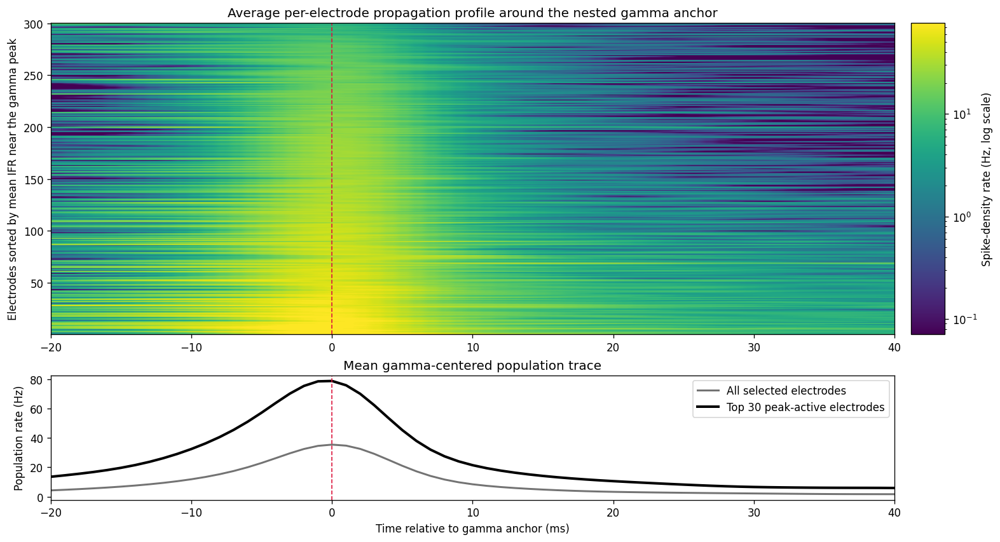

,electrode,window_mean_hz,peak_window_mean_hz,rebound_window_mean_hz,anchor_rate_hz,max_rate_hz
0,19528,31.032752,80.598412,18.850627,113.750059,118.302145
1,16345,26.922547,65.177442,16.393541,84.761498,84.949517
2,13143,30.655748,63.203300,10.920242,95.783492,98.966009
3,16449,23.737677,63.032449,6.955623,95.147045,95.147045
4,14354,26.762190,62.810550,13.556740,90.360891,91.465516
5,16012,35.247277,61.673854,23.281525,78.231991,82.419283
6,13142,33.429484,60.877751,9.539835,85.888015,88.823378
7,11628,30.946863,58.976696,11.095965,83.137024,86.405317
8,13363,24.932680,57.651069,7.111681,90.834098,91.789424
9,13361,29.629614,57.149700,7.945700,84.212604,84.708516


In [102]:
mean_aligned_electrode_rate = aligned_tensor.mean(axis=0)
peak_window_mask = (relative_time_ms >= -SORT_PEAK_PRE_MS) & (relative_time_ms <= SORT_PEAK_POST_MS)
rebound_window_mask = (relative_time_ms >= 15.0) & (relative_time_ms <= 25.0)

rate_summary = pd.DataFrame(
    {
        "electrode": selected_electrodes.astype(int),
        "window_mean_hz": mean_aligned_electrode_rate.mean(axis=1),
        "peak_window_mean_hz": mean_aligned_electrode_rate[:, peak_window_mask].mean(axis=1),
        "rebound_window_mean_hz": mean_aligned_electrode_rate[:, rebound_window_mask].mean(axis=1),
        "anchor_rate_hz": mean_aligned_electrode_rate[:, relative_time_ms == 0.0].reshape(-1),
        "max_rate_hz": mean_aligned_electrode_rate.max(axis=1),
    }
).sort_values(
    ["peak_window_mean_hz", "rebound_window_mean_hz", "max_rate_hz", "electrode"],
    ascending=[False, False, False, True],
).reset_index(drop=True)

ordered_electrodes = rate_summary["electrode"].to_numpy(dtype=int)
ordered_idx = np.array([np.flatnonzero(selected_electrodes == int(el))[0] for el in ordered_electrodes], dtype=int)
ordered_aligned_rate = mean_aligned_electrode_rate[ordered_idx]
top_active_count = min(60, max(10, ordered_aligned_rate.shape[0] // 10))
top_active_trace = ordered_aligned_rate[:top_active_count].mean(axis=0)

positive_aligned = ordered_aligned_rate[ordered_aligned_rate > 0]
aligned_vmin = max(1e-2, float(np.quantile(positive_aligned, 0.05)))
aligned_vmax = max(aligned_vmin * 10.0, float(np.quantile(positive_aligned, 0.995)))

fig = plt.figure(figsize=(13, 7), constrained_layout=True)
gs = fig.add_gridspec(2, 2, height_ratios=[3.0, 1.2], width_ratios=[40.0, 1.6])
ax0 = fig.add_subplot(gs[0, 0])
ax1 = fig.add_subplot(gs[1, 0], sharex=ax0)
cax = fig.add_subplot(gs[0, 1])
fig.add_subplot(gs[1, 1]).axis("off")

im = ax0.imshow(
    np.clip(ordered_aligned_rate, aligned_vmin, aligned_vmax),
    aspect="auto",
    origin="lower",
    extent=[relative_time_ms[0], relative_time_ms[-1], 0.5, ordered_aligned_rate.shape[0] + 0.5],
    cmap="viridis",
    norm=LogNorm(vmin=aligned_vmin, vmax=aligned_vmax),
)
ax0.axvline(0.0, color="crimson", ls="--", lw=1.0)
ax0.set_ylabel("Electrodes sorted by mean IFR near the gamma peak")
ax0.set_title("Average per-electrode propagation profile around the nested gamma anchor")

cbar = fig.colorbar(im, cax=cax)
cbar.set_label("Spike-density rate (Hz, log scale)")
cbar.locator = LogLocator(base=10)
cbar.formatter = LogFormatterMathtext(base=10)
cbar.update_ticks()

ax1.plot(relative_time_ms, population_windows.mean(axis=0), color="0.45", lw=1.8, label="All selected electrodes")
ax1.plot(relative_time_ms, top_active_trace, color="black", lw=2.4, label=f"Top {top_active_count} peak-active electrodes")
ax1.axvline(0.0, color="crimson", ls="--", lw=1.0)
ax1.set_xlabel("Time relative to gamma anchor (ms)")
ax1.set_ylabel("Population rate (Hz)")
ax1.set_title("Mean gamma-centered population trace")
ax1.legend(loc="upper right")
plt.show()

rate_summary.head(20)



## Peak-Time Ordered Propagation View

Sort electrodes by the timepoint of their own maximal mean IFR relative to the nested gamma anchor. This emphasizes ordering by when each electrode peaks, rather than by how strongly it fires.



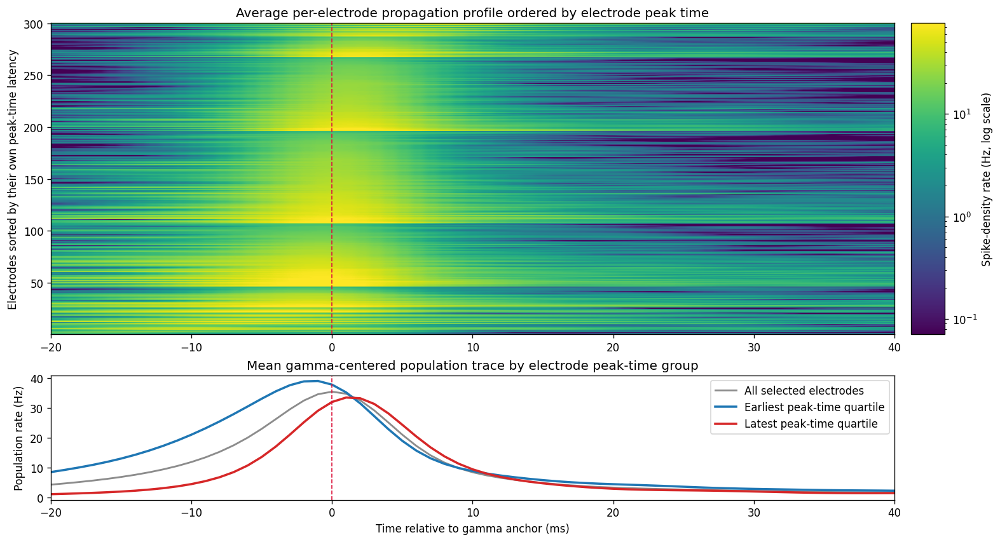

,electrode,peak_time_ms,peak_rate_hz,peak_window_mean_hz,rebound_window_mean_hz
0,15818,-19.0,7.346504,3.892474,0.930666
1,16135,-18.0,14.679351,3.222858,0.001235
2,5576,-13.0,21.606050,11.403664,1.889374
3,12031,-11.0,8.413199,5.301485,0.855419
4,22717,-10.0,44.728375,23.018025,6.902029
5,13360,-10.0,42.421571,29.950672,9.614057
6,7601,-10.0,35.433516,15.662083,6.977007
7,15879,-10.0,13.307783,5.912731,1.185410
8,7087,-9.0,13.488797,8.422960,1.091670
9,16638,-8.0,24.463181,12.202561,1.813011


In [103]:
peak_time_idx = np.argmax(mean_aligned_electrode_rate, axis=1)
peak_time_summary = rate_summary.merge(
    pd.DataFrame(
        {
            "electrode": selected_electrodes.astype(int),
            "peak_time_ms": relative_time_ms[peak_time_idx],
            "peak_rate_hz": mean_aligned_electrode_rate[np.arange(mean_aligned_electrode_rate.shape[0]), peak_time_idx],
        }
    ),
    on="electrode",
    how="left",
).sort_values(
    ["peak_time_ms", "peak_rate_hz", "peak_window_mean_hz", "electrode"],
    ascending=[True, False, False, True],
).reset_index(drop=True)

peak_time_electrodes = peak_time_summary["electrode"].to_numpy(dtype=int)
peak_time_order_idx = np.array([np.flatnonzero(selected_electrodes == int(el))[0] for el in peak_time_electrodes], dtype=int)
peak_time_ordered_rate = mean_aligned_electrode_rate[peak_time_order_idx]

early_cutoff = float(peak_time_summary["peak_time_ms"].quantile(0.25))
late_cutoff = float(peak_time_summary["peak_time_ms"].quantile(0.75))
early_trace = peak_time_ordered_rate[peak_time_summary["peak_time_ms"].to_numpy() <= early_cutoff].mean(axis=0)
late_trace = peak_time_ordered_rate[peak_time_summary["peak_time_ms"].to_numpy() >= late_cutoff].mean(axis=0)

peak_time_positive = peak_time_ordered_rate[peak_time_ordered_rate > 0]
peak_time_vmin = max(1e-2, float(np.quantile(peak_time_positive, 0.05)))
peak_time_vmax = max(peak_time_vmin * 10.0, float(np.quantile(peak_time_positive, 0.995)))

fig = plt.figure(figsize=(13, 7), constrained_layout=True)
gs = fig.add_gridspec(2, 2, height_ratios=[3.0, 1.2], width_ratios=[40.0, 1.6])
ax0 = fig.add_subplot(gs[0, 0])
ax1 = fig.add_subplot(gs[1, 0], sharex=ax0)
cax = fig.add_subplot(gs[0, 1])
fig.add_subplot(gs[1, 1]).axis("off")

im = ax0.imshow(
    np.clip(peak_time_ordered_rate, peak_time_vmin, peak_time_vmax),
    aspect="auto",
    origin="lower",
    extent=[relative_time_ms[0], relative_time_ms[-1], 0.5, peak_time_ordered_rate.shape[0] + 0.5],
    cmap="viridis",
    norm=LogNorm(vmin=peak_time_vmin, vmax=peak_time_vmax),
)
ax0.axvline(0.0, color="crimson", ls="--", lw=1.0)
ax0.set_ylabel("Electrodes sorted by their own peak-time latency")
ax0.set_title("Average per-electrode propagation profile ordered by electrode peak time")

cbar = fig.colorbar(im, cax=cax)
cbar.set_label("Spike-density rate (Hz, log scale)")
cbar.locator = LogLocator(base=10)
cbar.formatter = LogFormatterMathtext(base=10)
cbar.update_ticks()

ax1.plot(relative_time_ms, population_windows.mean(axis=0), color="0.55", lw=1.7, label="All selected electrodes")
ax1.plot(relative_time_ms, early_trace, color="#1f77b4", lw=2.1, label="Earliest peak-time quartile")
ax1.plot(relative_time_ms, late_trace, color="#d62728", lw=2.1, label="Latest peak-time quartile")
ax1.axvline(0.0, color="crimson", ls="--", lw=1.0)
ax1.set_xlabel("Time relative to gamma anchor (ms)")
ax1.set_ylabel("Population rate (Hz)")
ax1.set_title("Mean gamma-centered population trace by electrode peak-time group")
ax1.legend(loc="upper right")
plt.show()

peak_time_summary[["electrode", "peak_time_ms", "peak_rate_hz", "peak_window_mean_hz", "rebound_window_mean_hz"]].head(20)



## Ordering Correlation

Compare each electrode's rank under the activity-based ordering and the peak-time ordering. If the two orderings track each other, points should cluster near the diagonal.



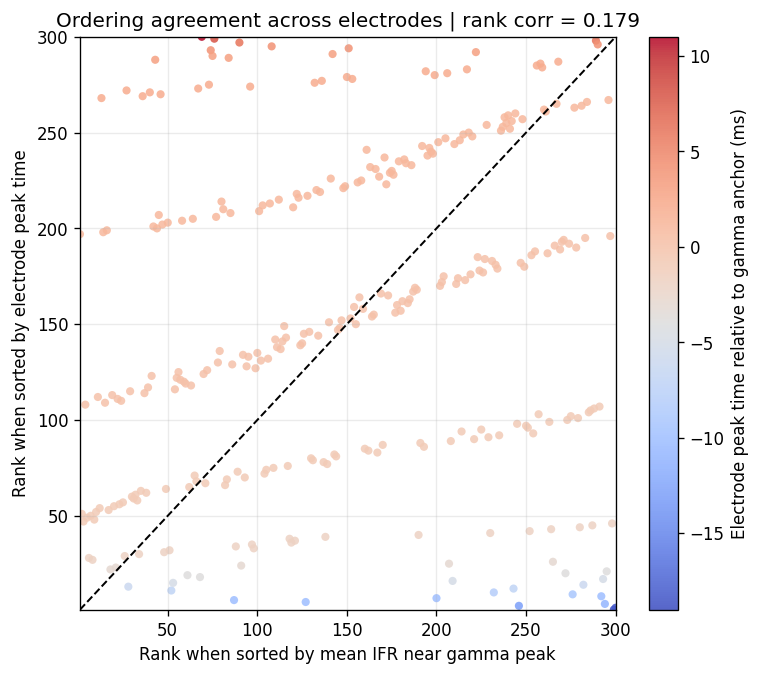

,electrode,peak_activity_rank,peak_time_ms,peak_rate_hz,peak_time_rank
0,19528,1,1.0,118.302145,197
1,16345,2,-1.0,84.949517,51
2,13143,3,-1.0,98.966009,47
3,16449,4,0.0,95.147045,108
4,14354,5,-1.0,91.465516,49
5,16012,6,-2.0,82.419283,28
6,13142,7,-1.0,88.823378,50
7,11628,8,-2.0,86.405317,27
8,13363,9,-1.0,91.789424,48
9,13361,10,-1.0,84.708516,52


In [104]:
activity_rank = rate_summary[["electrode"]].copy()
activity_rank["peak_activity_rank"] = np.arange(1, len(activity_rank) + 1, dtype=int)

peak_time_rank = peak_time_summary[["electrode", "peak_time_ms", "peak_rate_hz"]].copy()
peak_time_rank["peak_time_rank"] = np.arange(1, len(peak_time_rank) + 1, dtype=int)

ordering_compare = activity_rank.merge(peak_time_rank, on="electrode", how="inner")
rank_corr = float(np.corrcoef(ordering_compare["peak_activity_rank"], ordering_compare["peak_time_rank"])[0, 1])

fig, ax = plt.subplots(figsize=(7.2, 6.2))
scatter = ax.scatter(
    ordering_compare["peak_activity_rank"],
    ordering_compare["peak_time_rank"],
    c=ordering_compare["peak_time_ms"],
    s=24,
    cmap="coolwarm",
    alpha=0.85,
    edgecolors="none",
)
rank_min = 1
rank_max = len(ordering_compare)
ax.plot([rank_min, rank_max], [rank_min, rank_max], color="black", ls="--", lw=1.2)
ax.set_xlim(rank_min, rank_max)
ax.set_ylim(rank_min, rank_max)
ax.set_xlabel("Rank when sorted by mean IFR near gamma peak")
ax.set_ylabel("Rank when sorted by electrode peak time")
ax.set_title(f"Ordering agreement across electrodes | rank corr = {rank_corr:.3f}")
cbar = fig.colorbar(scatter, ax=ax)
cbar.set_label("Electrode peak time relative to gamma anchor (ms)")
ax.grid(True, alpha=0.25)
plt.show()

ordering_compare.sort_values("peak_activity_rank").head(20)



## X-Ordered Propagation View

Sort electrodes by their physical `x` position on the array to test the left-to-right propagation hypothesis directly.



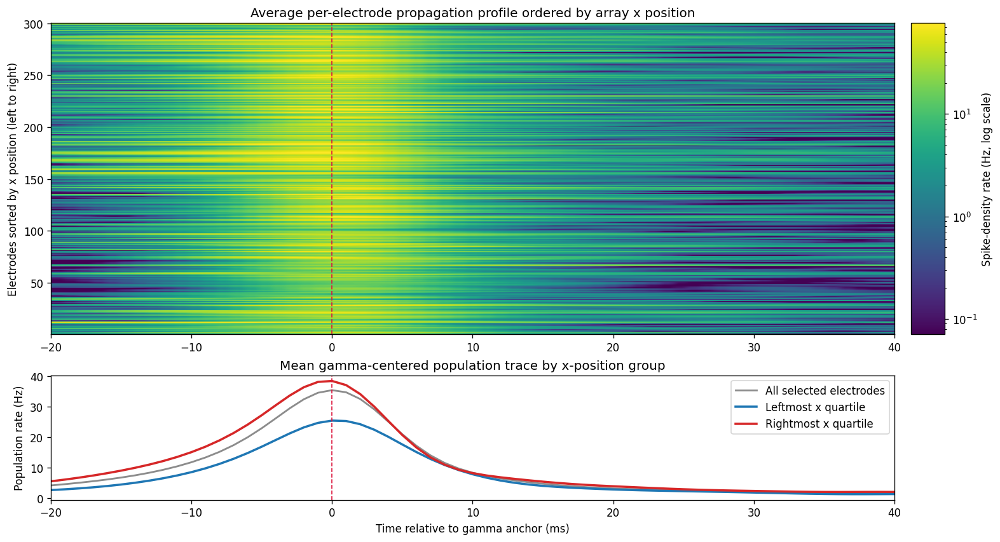

,electrode,x,y,peak_window_mean_hz,rebound_window_mean_hz
0,2221,367.5,175.0,7.421151,1.467588
1,4204,420.0,332.5,38.997809,10.097515
2,20487,472.5,1627.5,14.961634,0.786144
3,1349,507.5,105.0,10.354953,0.650811
4,10369,507.5,822.5,12.898751,0.748054
5,3111,542.5,245.0,14.271586,3.205893
6,7511,542.5,595.0,24.933569,2.357949
7,18951,542.5,1505.0,14.814693,1.076655
8,9055,612.5,717.5,20.119293,0.485815
9,10599,682.5,840.0,9.368228,0.223592


In [105]:
layout_df = pd.DataFrame(rec.layout)
layout_df = layout_df[layout_df["electrode"].isin(selected_electrodes)].drop_duplicates("electrode").copy()
layout_df = layout_df.merge(rate_summary, on="electrode", how="left")

x_sorted_layout = layout_df.sort_values(["x", "y", "peak_window_mean_hz", "electrode"], ascending=[True, True, False, True]).reset_index(drop=True)
x_sorted_electrodes = x_sorted_layout["electrode"].to_numpy(dtype=int)
x_sorted_idx = np.array([np.flatnonzero(selected_electrodes == int(el))[0] for el in x_sorted_electrodes], dtype=int)
x_sorted_rate = mean_aligned_electrode_rate[x_sorted_idx]

left_mask = x_sorted_layout["x"] <= x_sorted_layout["x"].quantile(0.25)
right_mask = x_sorted_layout["x"] >= x_sorted_layout["x"].quantile(0.75)
left_trace = x_sorted_rate[left_mask.to_numpy()].mean(axis=0)
right_trace = x_sorted_rate[right_mask.to_numpy()].mean(axis=0)

x_positive = x_sorted_rate[x_sorted_rate > 0]
x_vmin = max(1e-2, float(np.quantile(x_positive, 0.05)))
x_vmax = max(x_vmin * 10.0, float(np.quantile(x_positive, 0.995)))

fig = plt.figure(figsize=(13, 7), constrained_layout=True)
gs = fig.add_gridspec(2, 2, height_ratios=[3.0, 1.2], width_ratios=[40.0, 1.6])
ax0 = fig.add_subplot(gs[0, 0])
ax1 = fig.add_subplot(gs[1, 0], sharex=ax0)
cax = fig.add_subplot(gs[0, 1])
fig.add_subplot(gs[1, 1]).axis("off")

im = ax0.imshow(
    np.clip(x_sorted_rate, x_vmin, x_vmax),
    aspect="auto",
    origin="lower",
    extent=[relative_time_ms[0], relative_time_ms[-1], 0.5, x_sorted_rate.shape[0] + 0.5],
    cmap="viridis",
    norm=LogNorm(vmin=x_vmin, vmax=x_vmax),
)
ax0.axvline(0.0, color="crimson", ls="--", lw=1.0)
ax0.set_ylabel("Electrodes sorted by x position (left to right)")
ax0.set_title("Average per-electrode propagation profile ordered by array x position")

cbar = fig.colorbar(im, cax=cax)
cbar.set_label("Spike-density rate (Hz, log scale)")
cbar.locator = LogLocator(base=10)
cbar.formatter = LogFormatterMathtext(base=10)
cbar.update_ticks()

ax1.plot(relative_time_ms, population_windows.mean(axis=0), color="0.55", lw=1.7, label="All selected electrodes")
ax1.plot(relative_time_ms, left_trace, color="#1f77b4", lw=2.1, label="Leftmost x quartile")
ax1.plot(relative_time_ms, right_trace, color="#d62728", lw=2.1, label="Rightmost x quartile")
ax1.axvline(0.0, color="crimson", ls="--", lw=1.0)
ax1.set_xlabel("Time relative to gamma anchor (ms)")
ax1.set_ylabel("Population rate (Hz)")
ax1.set_title("Mean gamma-centered population trace by x-position group")
ax1.legend(loc="upper right")
plt.show()

x_sorted_layout[["electrode", "x", "y", "peak_window_mean_hz", "rebound_window_mean_hz"]].head(20)



## Hex-Tiled Array GIF

Use a coarser hexagonal tiling of the array so the global spread pattern is easier to see. Each frame shows the average high-resolution electrode IFR at that time relative to the nested gamma anchor.



Saved GIF to /Users/danielrebbin/Documents/GitHub/ephax/GIFs/ephax_rawh5_well5_gamma_ifr_grid.gif


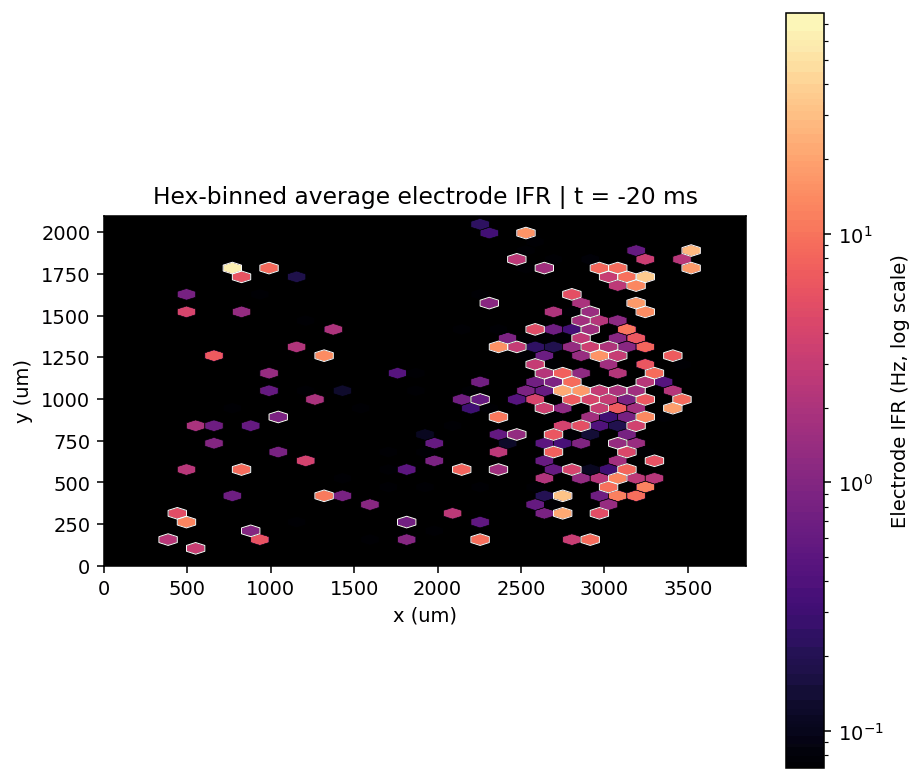

In [106]:
gif_path = repo_root / GIF_OUTPUT_PATH
frame_step = max(1, int(round(GIF_FRAME_STEP_MS / HIGHRES_BIN_MS)))
frame_indices = np.arange(0, len(relative_time_ms), frame_step, dtype=int)
full_layout_df = pd.DataFrame(rec.layout).drop_duplicates("electrode").copy()
hex_layout_df = full_layout_df[full_layout_df["electrode"].isin(selected_electrodes)].copy()
hex_x = hex_layout_df["x"].to_numpy(dtype=float)
hex_y = hex_layout_df["y"].to_numpy(dtype=float)
hex_electrodes = hex_layout_df["electrode"].to_numpy(dtype=int)
hex_idx = np.array([np.flatnonzero(selected_electrodes == int(el))[0] for el in hex_electrodes], dtype=int)
hex_xlim = (ARRAY_X_MIN_UM, ARRAY_X_MAX_UM)
hex_ylim = (ARRAY_Y_MIN_UM, ARRAY_Y_MAX_UM)
hex_box_aspect = (hex_ylim[1] - hex_ylim[0]) / max(hex_xlim[1] - hex_xlim[0], 1e-9)
hex_extent = (*hex_xlim, *hex_ylim)
any_aligned_spike = aligned_spike_tensor.any(axis=0)

grid_positive = mean_aligned_electrode_rate[mean_aligned_electrode_rate > 0]
grid_vmin = max(1e-2, float(np.quantile(grid_positive, 0.05)))
grid_vmax = max(grid_vmin * 10.0, float(np.quantile(grid_positive, 0.995)))

with imageio.get_writer(gif_path, mode="I", duration=0.14) as writer:
    for time_index in frame_indices:
        values = mean_aligned_electrode_rate[hex_idx, int(time_index)]
        spike_mask = any_aligned_spike[hex_idx, int(time_index)]
        fig, ax = plt.subplots(figsize=(7.4, 7.0))
        hb = ax.hexbin(
            hex_x,
            hex_y,
            C=np.clip(values, grid_vmin, grid_vmax),
            reduce_C_function=np.mean,
            gridsize=HEX_GRID_SIZE,
            cmap="magma",
            mincnt=1,
            linewidths=0.35,
            edgecolors="black",
            norm=LogNorm(vmin=grid_vmin, vmax=grid_vmax),
            extent=hex_extent,
        )
        if np.any(spike_mask):
            spike_hb = ax.hexbin(
                hex_x[spike_mask],
                hex_y[spike_mask],
                gridsize=HEX_GRID_SIZE,
                mincnt=1,
                linewidths=0.35,
                edgecolors="white",
                facecolors="none",
                extent=hex_extent,
            )
            spike_hb.set_facecolor("none")
            spike_hb.set_edgecolor("white")
            spike_hb.set_linewidth(0.5)
        ax.set_facecolor("black")
        ax.set_xlim(*hex_xlim)
        ax.set_ylim(*hex_ylim)
        ax.set_xlabel("x (um)")
        ax.set_ylabel("y (um)")
        ax.set_aspect("equal", adjustable="box")
        ax.set_box_aspect(hex_box_aspect)
        ax.set_title(f"Hex-binned average electrode IFR | t = {relative_time_ms[time_index]:.0f} ms")
        cbar = fig.colorbar(hb, ax=ax, label="Electrode IFR (Hz, log scale)")
        cbar.locator = LogLocator(base=10)
        cbar.formatter = LogFormatterMathtext(base=10)
        cbar.update_ticks()
        buf = BytesIO()
        fig.savefig(buf, format="png", dpi=140, bbox_inches="tight")
        buf.seek(0)
        writer.append_data(imageio.imread(buf))
        buf.close()
        plt.close(fig)

print(f"Saved GIF to {gif_path}")
display(Image(filename=str(gif_path)))



## Next Step

The notebook now uses nested anchoring, ranks electrodes by peak-window IFR, shows an x-ordered propagation view, and renders a coarse hex-binned gamma-centered GIF. The next useful refinement is to compare this average-array GIF against event-specific GIFs from only the strongest bursts, so that propagation structure is not averaged away.

